In [1]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
from tqdm import tqdm
import cv2 
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.utils import shuffle           
import matplotlib.pyplot as plt   


### Assign the train and test path

In [2]:
train_path = "./data/train/"
test_path = "./data/valid/"

In [3]:
for i in os.listdir(train_path):
    print(i)

freshapples
freshbanana
freshoranges
rottenapples
rottenbanana
rottenoranges


In [4]:
for i in os.listdir(test_path):
    print(i)

freshapples
freshbanana
freshoranges
rottenapples
rottenbanana
rottenoranges


## Load the Data

In [5]:
class_names = ['freshapples', 'freshbanana', 'freshoranges', 'rottenapples', 'rottenbanana', 'rottenoranges']
class_names_label = {class_name:i for i, class_name in enumerate(class_names)}

nb_classes = len(class_names)

IMAGE_SIZE = (224,224)

In [6]:
    datasets = [train_path, test_path]
    output = []
    
    # Iterate through training and test sets
    for dataset in datasets:
        
        print(dataset)
        for folder in os.listdir(dataset):
            print(folder)

./data/train/
freshapples
freshbanana
freshoranges
rottenapples
rottenbanana
rottenoranges
./data/valid/
freshapples
freshbanana
freshoranges
rottenapples
rottenbanana
rottenoranges


In [7]:
freshfruits = []
rottenfruits = []
freshnames = ['freshapples','freshbanana','freshoranges']
rottennames = ['rottenapples','rottenbanana','rottenoranges']

In [8]:
def load_data():
    datasets = [train_path, test_path]
    output = []
    
    # Iterate through training and test sets
    for dataset in datasets:
        
        images = []
        labels = []
        
        print("Loading {}".format(dataset))
        
        # Iterate through each folder corresponding to a category
        for folder in os.listdir(dataset):
            label = class_names_label[folder]
            
            # Iterate through each image in our folder
            for file in tqdm(os.listdir(os.path.join(dataset, folder))):
                
                # Get the path name of the image
                img_path = os.path.join(os.path.join(dataset, folder), file)
                
                # Open and resize the img
                image = cv2.imread(img_path)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                image = cv2.resize(image, IMAGE_SIZE) 
                
                # Append the image and its corresponding label to the output
                images.append(image)
                labels.append(label)
                if folder in freshnames:
                    freshfruits.append(image)
                elif folder in rottennames:
                    rottenfruits.append(image)
                
        images = np.array(images, dtype = 'float32')
        labels = np.array(labels, dtype = 'int32')   
        
        output.append((images, labels))

    return output

In [9]:
(train_images, train_labels), (test_images, test_labels) = load_data()

Loading ./data/train/


100%|█████████████████████████████████████████████████████████████████████████████| 1595/1595 [00:05<00:00, 277.31it/s]


Loading ./data/valid/


100%|███████████████████████████████████████████████████████████████████████████████| 403/403 [00:01<00:00, 265.30it/s]


In [10]:
test_images.shape

(2698, 224, 224, 3)

## Exploratory Data Analysis - EDA

In [11]:
n_train = train_labels.shape[0]
n_test = test_labels.shape[0]

print ("Number of training examples: {}".format(n_train))
print ("Number of testing examples: {}".format(n_test))
print ("Each image is of size: {}".format(IMAGE_SIZE))

Number of training examples: 10901
Number of testing examples: 2698
Each image is of size: (224, 224)


In [12]:
len(freshfruits)
freshfruits = np.array(freshfruits, dtype = 'float32')

In [13]:
len(rottenfruits)
rottenfruits = np.array(rottenfruits, dtype = 'float32')

<Figure size 800x800 with 0 Axes>

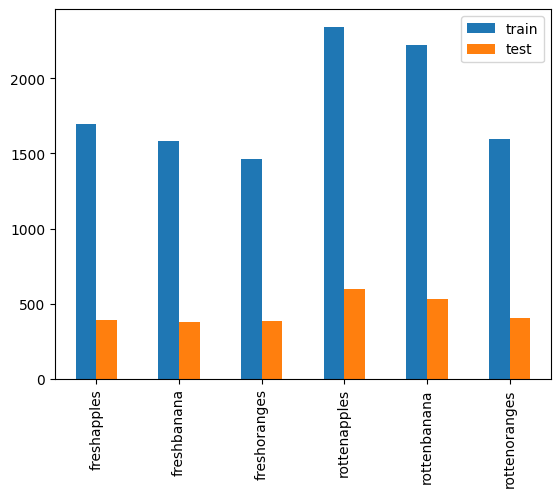

In [82]:
import pandas as pd

_, train_counts = np.unique(train_labels, return_counts=True)
_, test_counts = np.unique(test_labels, return_counts=True)
count_df = pd.DataFrame({'train': train_counts,
                    'test': test_counts}, 
             index=class_names
            )
count_df.plot.bar()
plt.show()

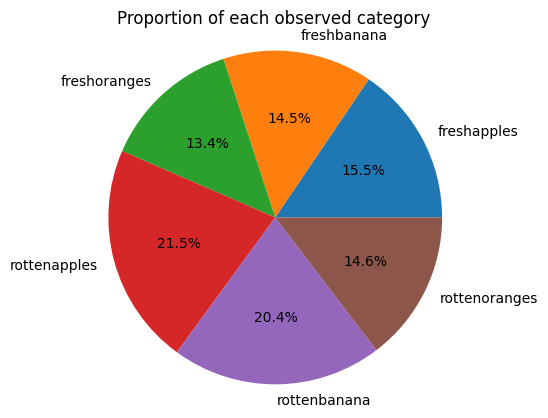

In [15]:
plt.pie(train_counts,
        explode=(0, 0, 0, 0, 0, 0) , 
        labels=class_names,
        autopct='%1.1f%%')
plt.axis('equal')
plt.title('Proportion of each observed category')
plt.show()

In [16]:
train_images = train_images / 255.0 
test_images = test_images / 255.0

In [17]:
dir_name = os.listdir(train_path)
dir_name

['freshapples',
 'freshbanana',
 'freshoranges',
 'rottenapples',
 'rottenbanana',
 'rottenoranges']

In [18]:
# Create empty dataframe and list
df = pd.DataFrame({})
lists = []
cate = []

# get the filenames
for dir_ in dir_name:
    # file name
    list_ = os.listdir(train_path+dir_+"/")
    lists = lists+list_
    # category name
    cate_ = np.tile(dir_,len(list_))
    cate = np.concatenate([cate,cate_])

# insert dataframe
df["cate"] = cate
df["name"] = lists

In [19]:
img_data = []
# Define data size
size = 128

# Data loading
for dir_ in dir_name:
    for name in df[df["cate"]==dir_]["name"]:
        path = train_path+dir_+"/"+name+""
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Change to color array, BGR⇒RGB
        image = cv2.resize(img, (size,size), interpolation=cv2.INTER_AREA)
        img_data.append(image)

# Add to dataframe
df["img"] = img_data

In [20]:
# image check
cate_name = df["cate"].value_counts().index

fig, ax = plt.subplots(6,4, figsize=(10,20))
for i in range(6):
    for j in range(4):
        ax[i,j].imshow(df[df["cate"]==cate_name[i]]["img"].values[j])
        ax[i,j].set_title(cate_name[i])

In [21]:
# Create each category dataframe
fa_df = pd.DataFrame({})
fb_df = pd.DataFrame({})
fo_df = pd.DataFrame({})
ra_df = pd.DataFrame({})
rb_df = pd.DataFrame({})
ro_df = pd.DataFrame({})

## Analysing RGB distribution with Plots

In [22]:
# Define function
def create_rgb_df(sample_df):
    create_df = pd.DataFrame({})
    # Create each list
    red_mean = []
    red_std = []
    green_mean = []
    green_std = []
    blue_mean = []
    blue_std = []
    
    for i in range(len(sampling_df )):
        red_m = sampling_df["img"].values[i][:,:,0].mean()
        red_s = sampling_df["img"].values[i][:,:,0].std()
        green_m = sampling_df["img"].values[i][:,:,1].mean()
        green_s = sampling_df["img"].values[i][:,:,1].std()
        blue_m = sampling_df["img"].values[i][:,:,2].mean()
        blue_s = sampling_df["img"].values[i][:,:,2].std()
        # Append to list
        red_mean.append(red_m)
        red_std.append(red_s)
        green_mean.append(green_m)
        green_std.append(green_s)
        blue_mean.append(blue_m)
        blue_std.append(blue_s)

    create_df["red_mean"] = red_mean
    create_df["red_std"] = red_std
    create_df["green_mean"] = green_mean
    create_df["green_std"] = green_std
    create_df["blue_mean"] = blue_mean
    create_df["blue_std"] = blue_std
    
    return create_df

In [23]:
class_names

['freshapples',
 'freshbanana',
 'freshoranges',
 'rottenapples',
 'rottenbanana',
 'rottenoranges']

In [24]:
# Define sampling_df of glacier
sampling_df = df[df["cate"]=="freshapples"]
fa_df = create_rgb_df(sampling_df)

# Define sampling_df of mountain
sampling_df = df[df["cate"]=="freshbanana"]
fb_df = create_rgb_df(sampling_df)

# Define sampling_df of sea
sampling_df = df[df["cate"]=="freshoranges"]
fo_df = create_rgb_df(sampling_df)

# Define sampling_df of street
sampling_df = df[df["cate"]=="rottenapples"]
ra_df = create_rgb_df(sampling_df)

# Define sampling_df of forest
sampling_df = df[df["cate"]=="rottenbanana"]
rb_df = create_rgb_df(sampling_df)

# Define sampling_df of building
sampling_df = df[df["cate"]=="rottenoranges"]
ro_df = create_rgb_df(sampling_df)

C:\Users\venna\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\venna\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\venna\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

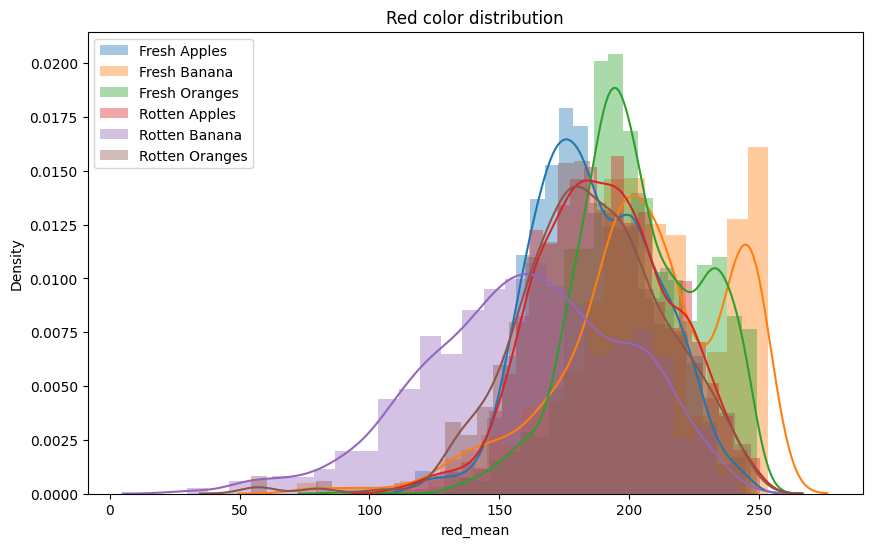

In [45]:
# Visualization of Red mean distribution
plt.figure(figsize=(10,6))
sns.distplot(fa_df["red_mean"], label="Fresh Apples")
sns.distplot(fb_df["red_mean"],label="Fresh Banana")
sns.distplot(fo_df["red_mean"], label="Fresh Oranges")
sns.distplot(ra_df["red_mean"], label="Rotten Apples")
sns.distplot(rb_df["red_mean"], label="Rotten Banana")
sns.distplot(ro_df["red_mean"], label="Rotten Oranges")
plt.title("Red color distribution")
plt.legend()
plt.show()

C:\Users\venna\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\venna\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\venna\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

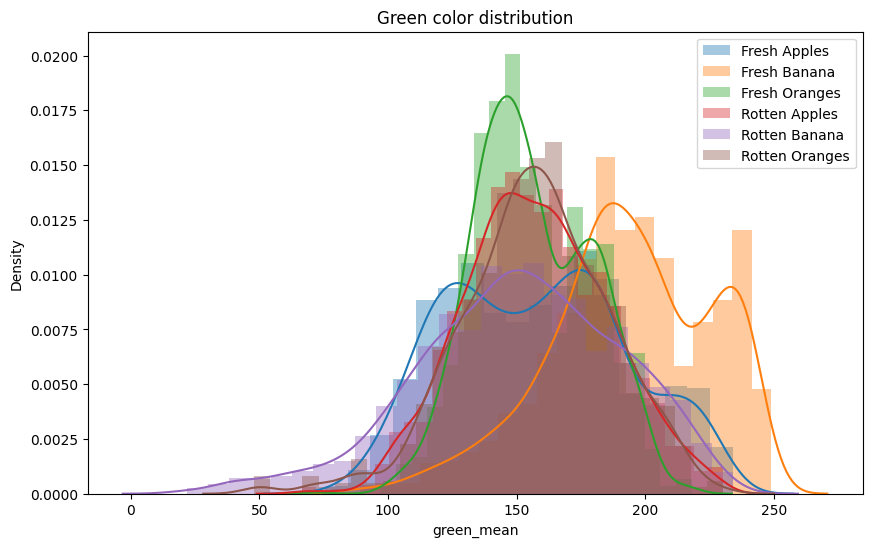

In [46]:
# Visualization of Red mean distribution
plt.figure(figsize=(10,6))
sns.distplot(fa_df["green_mean"], label="Fresh Apples")
sns.distplot(fb_df["green_mean"],label="Fresh Banana")
sns.distplot(fo_df["green_mean"], label="Fresh Oranges")
sns.distplot(ra_df["green_mean"], label="Rotten Apples")
sns.distplot(rb_df["green_mean"], label="Rotten Banana")
sns.distplot(ro_df["green_mean"], label="Rotten Oranges")
plt.title("Green color distribution")
plt.legend()
plt.show()

C:\Users\venna\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\venna\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\venna\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

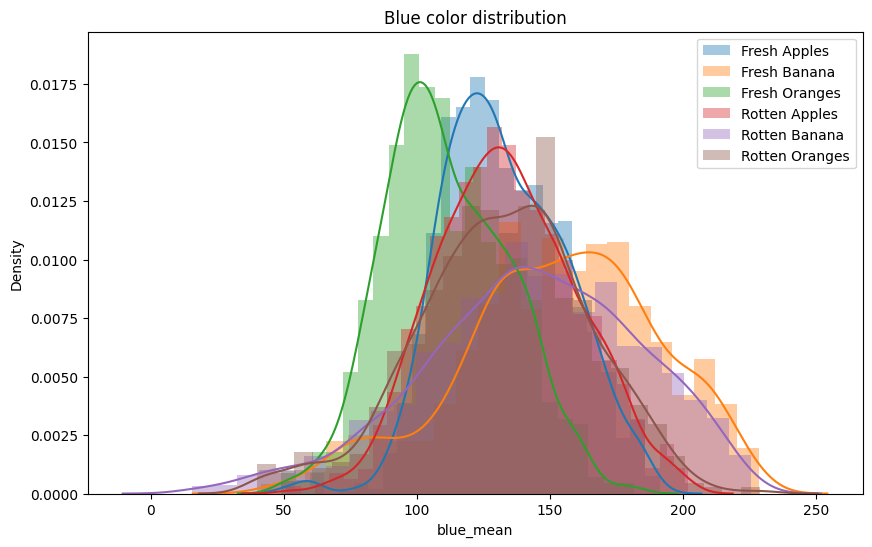

In [47]:
# Visualization of Red mean distribution
plt.figure(figsize=(10,6))
sns.distplot(fa_df["blue_mean"], label="Fresh Apples")
sns.distplot(fb_df["blue_mean"],label="Fresh Banana")
sns.distplot(fo_df["blue_mean"], label="Fresh Oranges")
sns.distplot(ra_df["blue_mean"], label="Rotten Apples")
sns.distplot(rb_df["blue_mean"], label="Rotten Banana")
sns.distplot(ro_df["blue_mean"], label="Rotten Oranges")
plt.title("Blue color distribution")
plt.legend()
plt.show()

## Display images from each category

In [28]:
def display_random_image(class_names, images, labels):
    """
        Display a random image from the images array and its correspond label from the labels array.
    """
    
    index = np.random.randint(images.shape[0])
    plt.figure()
    plt.imshow(images[index])
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.title('Image #{} : '.format(index) + class_names[labels[index]])
    plt.show()

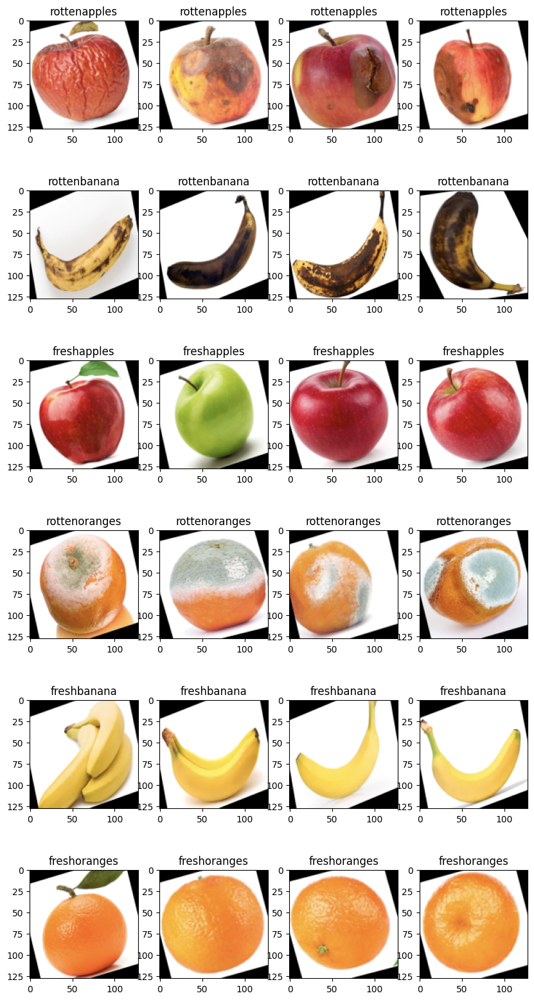

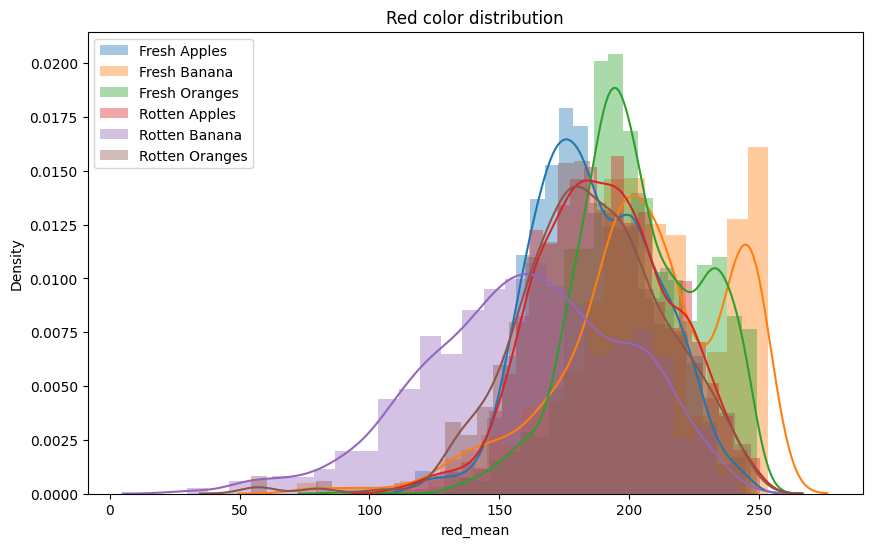

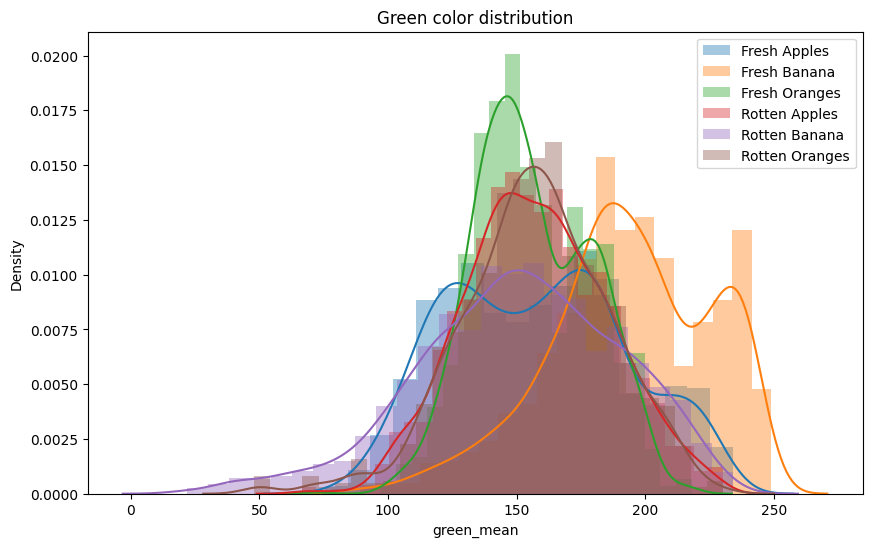

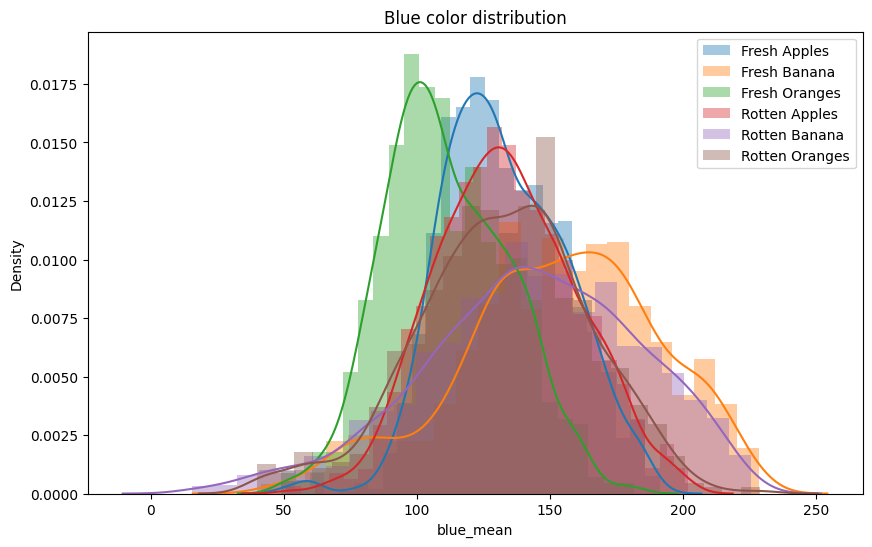

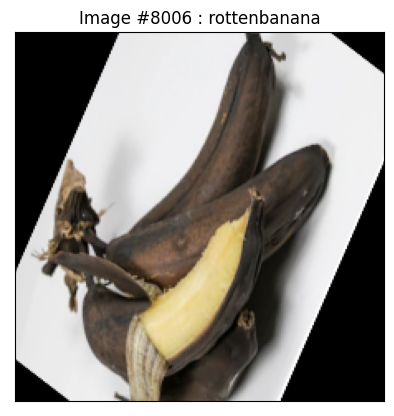

In [29]:
display_random_image(class_names, train_images, train_labels)

In [30]:
def display_examples(class_names, images, labels,fruit):
    """
        Display 25 images from the images array with its corresponding labels
    """
    
    fig = plt.figure(figsize=(10,10))
    fig.suptitle("Some examples of images of the dataset", fontsize=16)
    
    for i in range(25):
        plt.subplot(5,5,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(images[fruit], cmap=plt.cm.binary)
        plt.xlabel(class_names[labels[fruit]])
        fruit+=1
    plt.show()

In [31]:
class_names[train_labels[4000]]

'freshoranges'

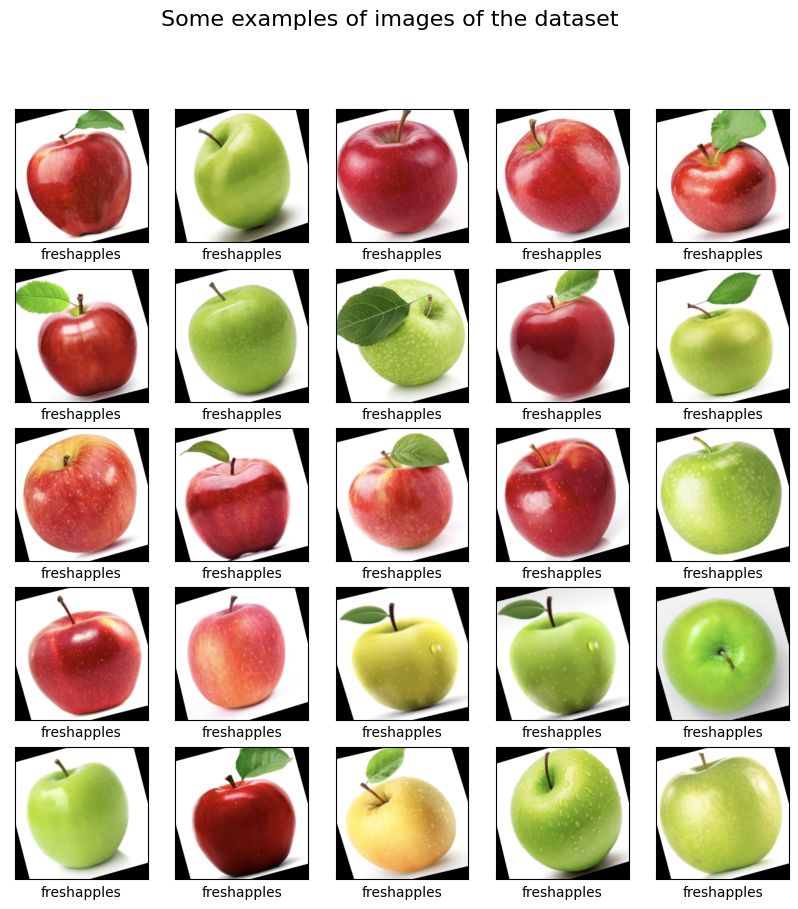

In [32]:
display_examples(class_names, train_images, train_labels,0)

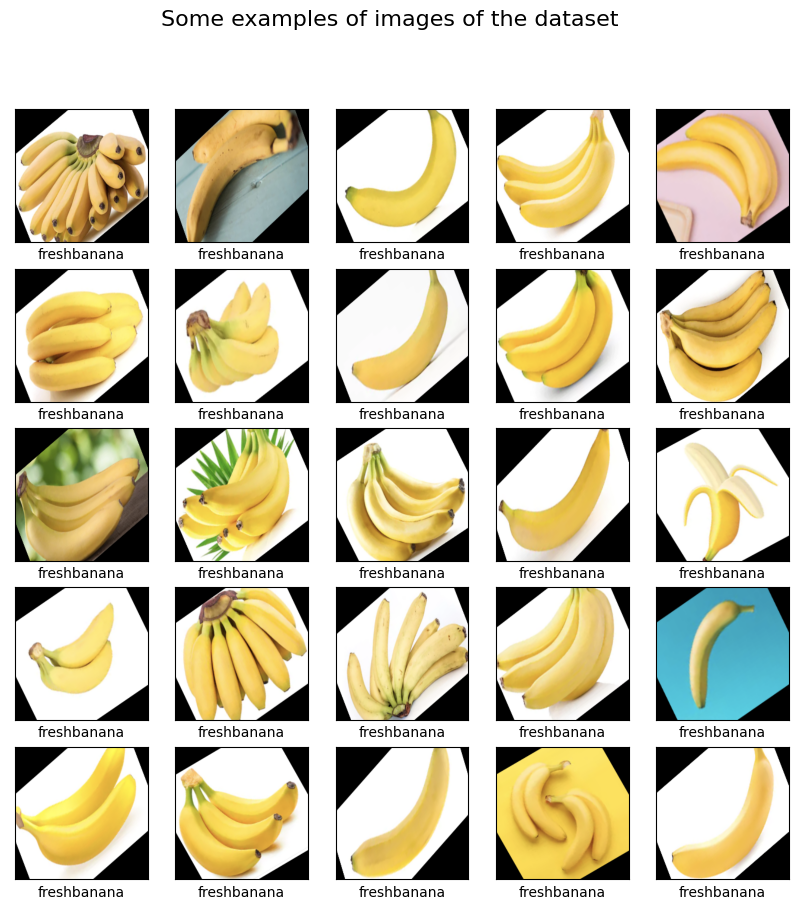

In [33]:
display_examples(class_names, train_images, train_labels,2000)

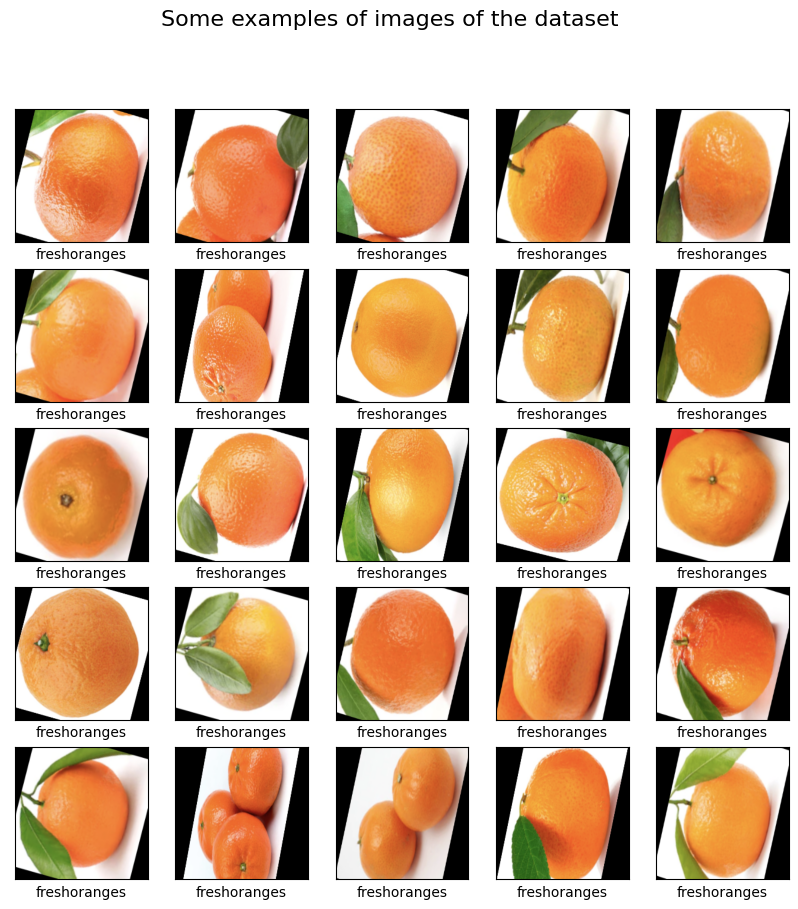

In [34]:
display_examples(class_names, train_images, train_labels,4000)

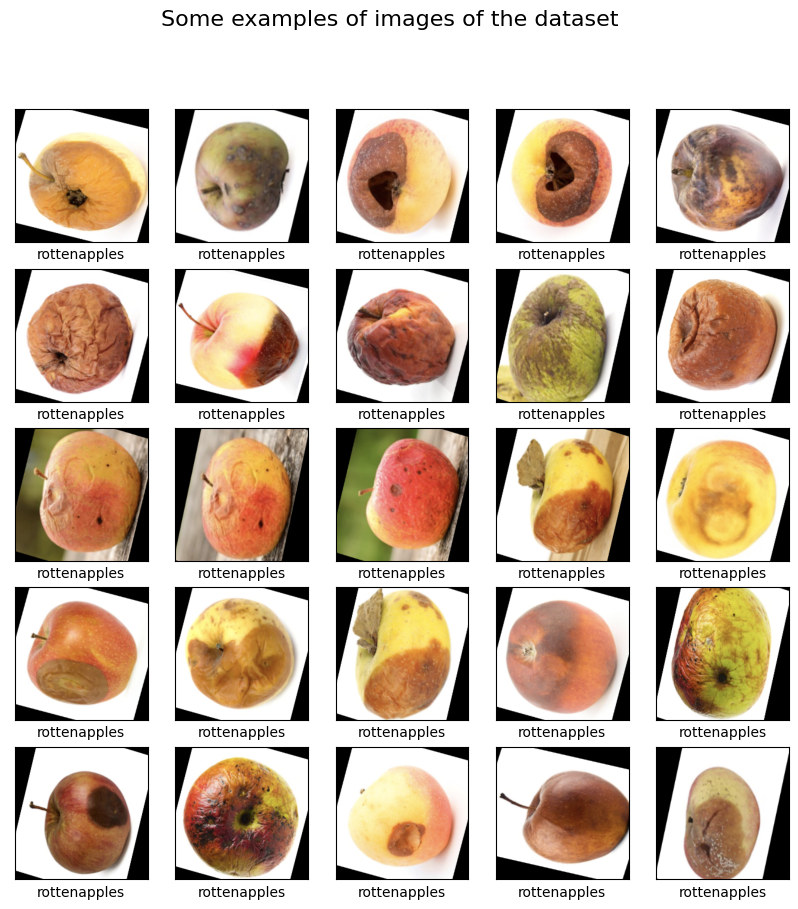

In [35]:
display_examples(class_names, train_images, train_labels,6000)

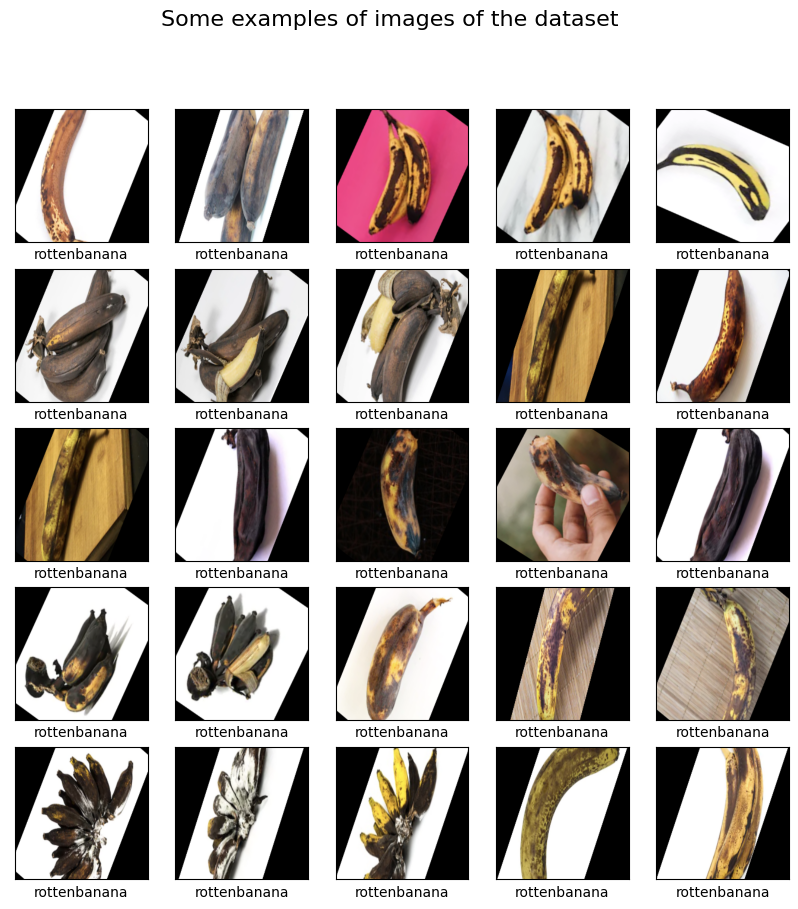

In [36]:
display_examples(class_names, train_images, train_labels,8000)

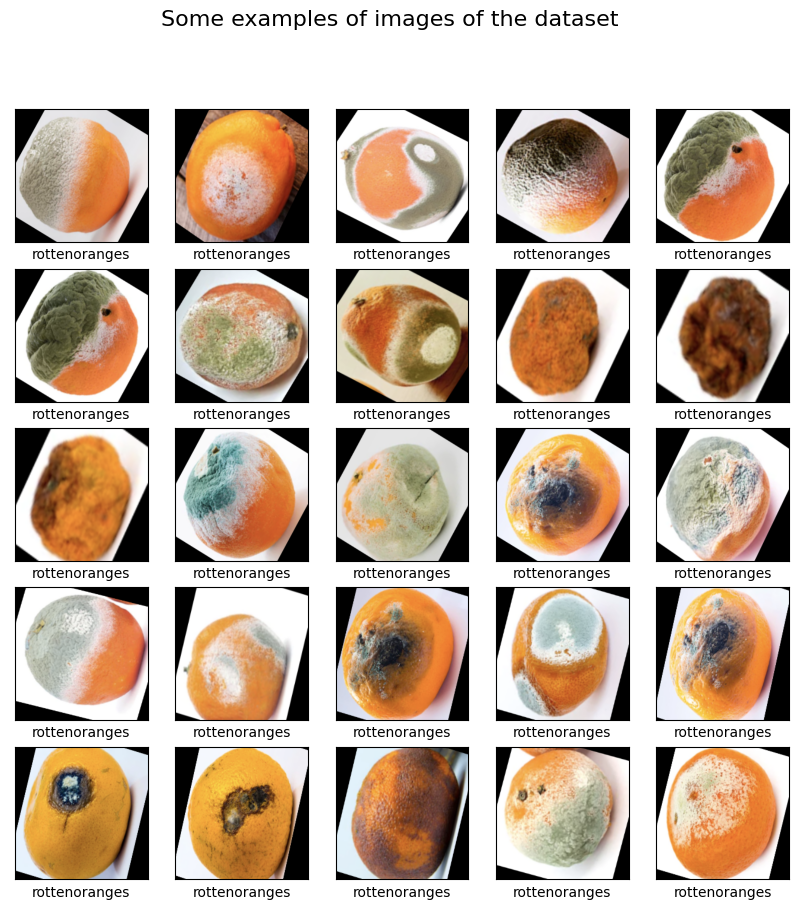

In [37]:
display_examples(class_names, train_images, train_labels,10000)

In [38]:
train_images

array([[[[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         ...,
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ]],

        [[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         ...,
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ]],

        [[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         ...,
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ]],

        ...,

        [[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ]

In [39]:
freshfruits = freshfruits / 255.0 
rottenfruits = rottenfruits / 255.0

# Average Image Map

In [40]:
def find_mean_img(full_mat, title, size = (512,512)):
    # calculate the average
    mean_img = np.mean(full_mat, axis = 0)
    # reshape it back to a matrix
#     mean_img = mean_img.reshape(size)
    plt.imshow(mean_img, vmin=0, vmax=255, cmap='Greys_r')
    plt.title(f'Average {title}')
    plt.axis('off')
    plt.show()
    return mean_img



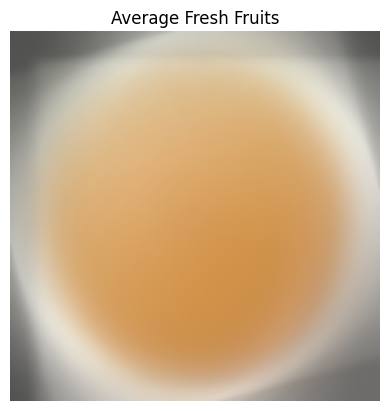

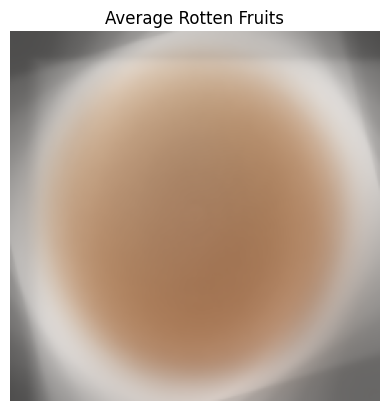

In [41]:
fresh_mean = find_mean_img(freshfruits, 'Fresh Fruits')
rotten_mean = find_mean_img(rottenfruits, 'Rotten Fruits')

## Contrast Map Difference

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


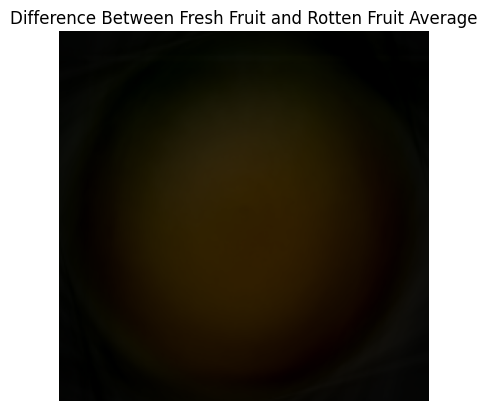

In [42]:

contrast_mean = fresh_mean- rotten_mean
plt.imshow(contrast_mean, cmap='bwr')
plt.title(f'Difference Between Fresh Fruit and Rotten Fruit Average')
plt.axis('off')
plt.show()

## Base Model

In [43]:
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation = 'relu', input_shape = (224, 224, 3)), 
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(32, (3, 3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation=tf.nn.relu),
    tf.keras.layers.Dense(6, activation=tf.nn.softmax)
])

In [44]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics=['accuracy'])

#### Run all above this cell

In [45]:
history = model.fit(train_images, train_labels, batch_size=128, epochs=5, validation_split = 0.2)

Epoch 1/5
69/69 [==============================] - 298s 4s/step - loss: 1.6083 - accuracy: 0.6940 - val_loss: 7.5556 - val_accuracy: 0.2013
Epoch 2/5
69/69 [==============================] - 279s 4s/step - loss: 0.2312 - accuracy: 0.9175 - val_loss: 9.8669 - val_accuracy: 0.1981
Epoch 3/5
69/69 [==============================] - 278s 4s/step - loss: 0.1366 - accuracy: 0.9515 - val_loss: 11.2604 - val_accuracy: 0.2196
Epoch 4/5
69/69 [==============================] - 273s 4s/step - loss: 0.1015 - accuracy: 0.9651 - val_loss: 12.3355 - val_accuracy: 0.2380
Epoch 5/5
69/69 [==============================] - 274s 4s/step - loss: 0.0890 - accuracy: 0.9681 - val_loss: 12.8328 - val_accuracy: 0.2338


In [68]:
def plot_accuracy_loss(history):
    """
        Plot the accuracy and the loss during the training of the nn.
    """
    fig = plt.figure(figsize=(10,5))

    # Plot accuracy
    plt.subplot(221)
    plt.plot(history.history['accuracy'],'bo--', label = "acc")
    plt.plot(history.history['val_accuracy'], 'ro--', label = "val_acc")
    plt.title("train_acc vs val_acc")
    plt.ylabel("accuracy")
    plt.xlabel("epochs")
    plt.legend()

    # Plot loss function
    plt.subplot(222)
    plt.plot(history.history['loss'],'bo--', label = "loss")
    plt.plot(history.history['val_loss'], 'ro--', label = "val_loss")
    plt.title("train_loss vs val_loss")
    plt.ylabel("loss")
    plt.xlabel("epochs")

    plt.legend()
    plt.show()

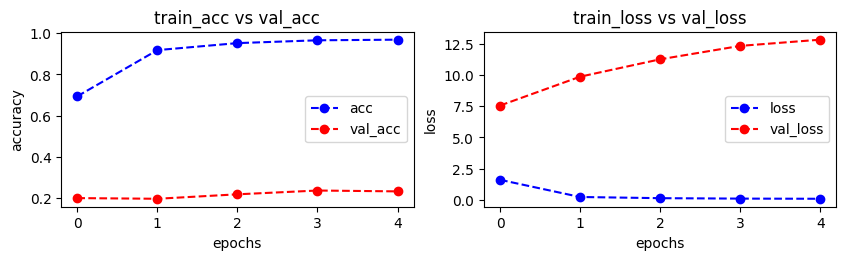

In [47]:
plot_accuracy_loss(history)

In [48]:
test_loss = model.evaluate(test_images, test_labels)

85/85 [==============================] - 20s 239ms/step - loss: 2.7179 - accuracy: 0.8110


85/85 [==============================] - 21s 230ms/step


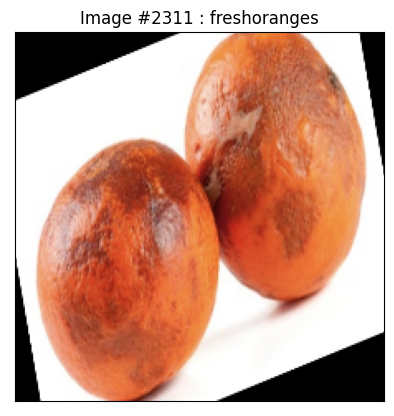

In [49]:
predictions = model.predict(test_images)     # Vector of probabilities
pred_labels = np.argmax(predictions, axis = 1) # We take the highest probability

display_random_image(class_names, test_images, pred_labels)

In [50]:
def print_mislabeled_images(class_names, test_images, test_labels, pred_labels):
    """
        Print 25 examples of mislabeled images by the classifier, e.g when test_labels != pred_labels
    """
    BOO = (test_labels == pred_labels)
    mislabeled_indices = np.where(BOO == 0)
    mislabeled_images = test_images[mislabeled_indices]
    mislabeled_labels = pred_labels[mislabeled_indices]

    title = "Some examples of mislabeled images by the classifier:"
    display_examples(class_names,  mislabeled_images, mislabeled_labels,0)

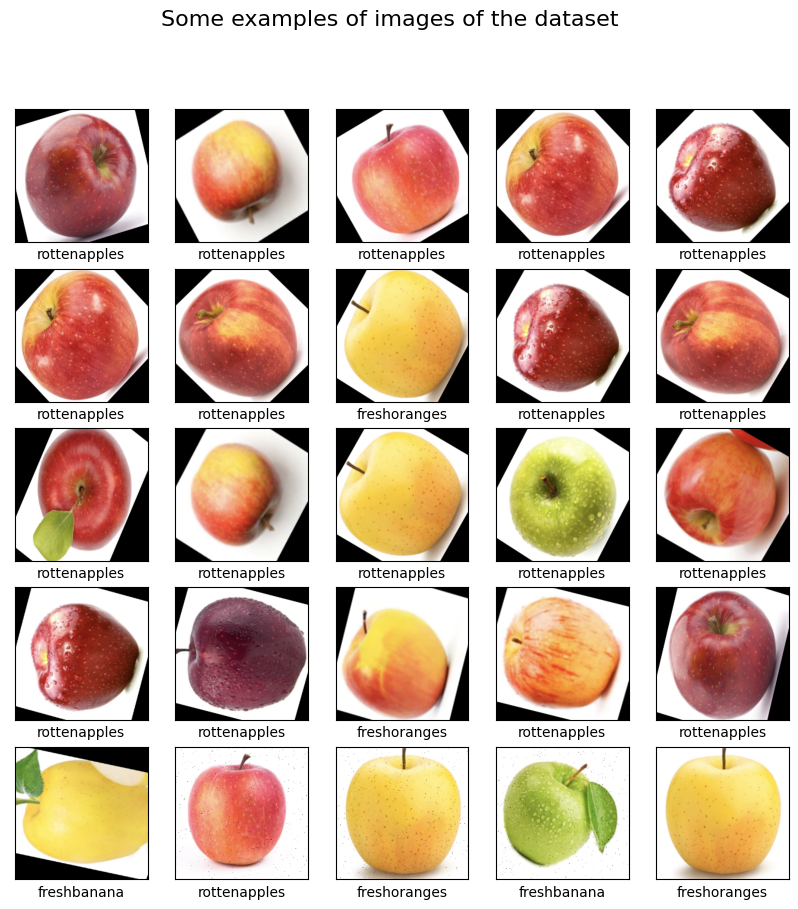

In [51]:
print_mislabeled_images(class_names, test_images, test_labels, pred_labels)

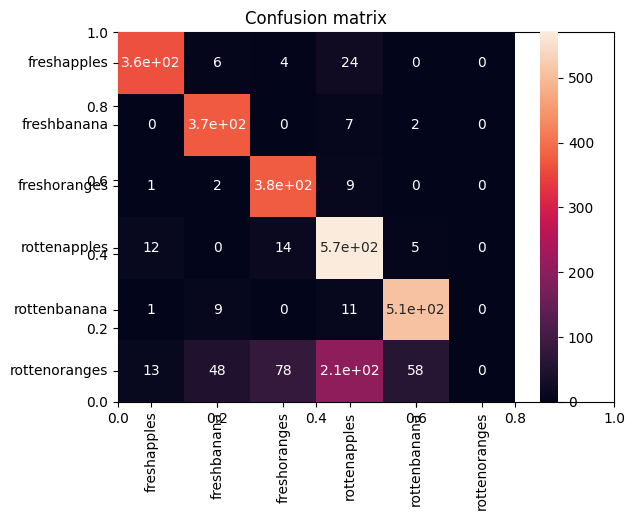

In [53]:
CM = confusion_matrix(test_labels, pred_labels)
ax = plt.axes()
sns.heatmap(CM, annot=True, 
           annot_kws={"size": 10}, 
           xticklabels=class_names, 
           yticklabels=class_names, ax = ax)
ax.set_title('Confusion matrix')
plt.show()

## Feature Extraction using VGG16

In [50]:
from keras.applications.vgg16 import VGG16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input

model = VGG16(weights='imagenet', include_top=False)

In [51]:
train_features = model.predict(train_images)
test_features = model.predict(test_images)

85/85 [==============================] - 1011s 12s/step


In [52]:
n_train, x, y, z = train_features.shape
n_test, x, y, z = test_features.shape
numFeatures = x * y * z

In [57]:
z

512

In [58]:
from sklearn import decomposition

pca = decomposition.PCA(n_components = 2)

X = train_features.reshape((n_train, x*y*z))
pca.fit(X)

C = pca.transform(X) # Représentation des individus dans les nouveaux axe
C1 = C[:,0]
C2 = C[:,1]

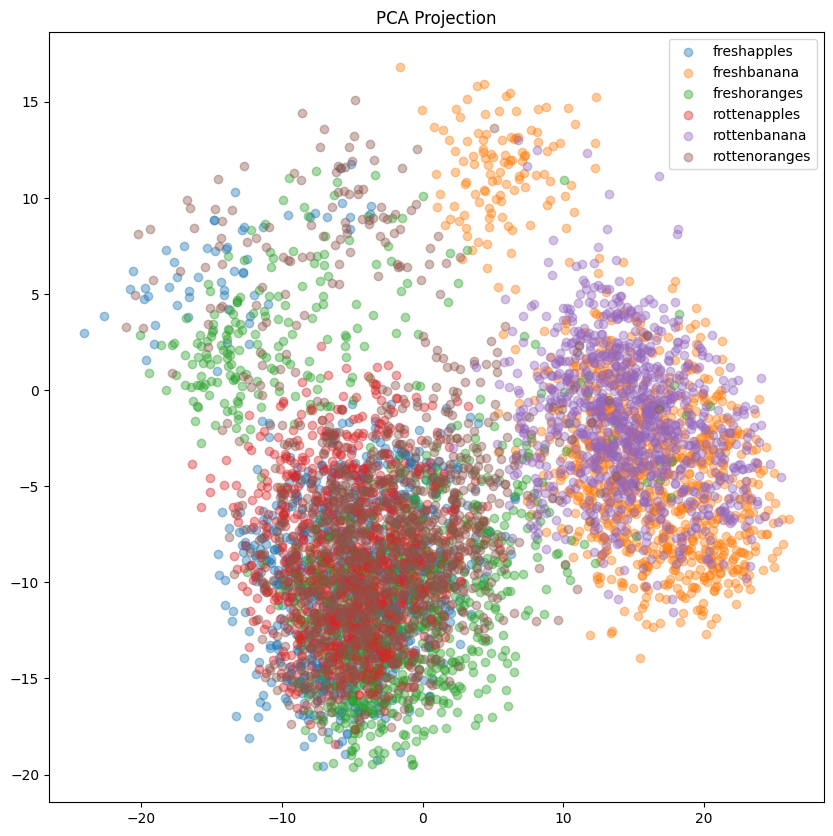

In [59]:
### Figures

plt.subplots(figsize=(10,10))

for i, class_name in enumerate(class_names):
    plt.scatter(C1[train_labels == i][:1000], C2[train_labels == i][:1000], label = class_name, alpha=0.4)
plt.legend()
plt.title("PCA Projection")
plt.show()

In [60]:
model2 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape = (x, y, z)),
    tf.keras.layers.Dense(50, activation=tf.nn.relu),
    tf.keras.layers.Dense(6, activation=tf.nn.softmax)
])

model2.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics=['accuracy'])

history2 = model2.fit(train_features, train_labels, batch_size=128, epochs=15, validation_split = 0.2)


Epoch 1/15
69/69 [==============================] - 2s 24ms/step - loss: 0.6336 - accuracy: 0.8138 - val_loss: 13.1569 - val_accuracy: 0.2462
Epoch 2/15
69/69 [==============================] - 1s 20ms/step - loss: 0.0992 - accuracy: 0.9782 - val_loss: 13.0888 - val_accuracy: 0.2513
Epoch 3/15
69/69 [==============================] - 1s 20ms/step - loss: 0.0528 - accuracy: 0.9900 - val_loss: 12.7266 - val_accuracy: 0.2380
Epoch 4/15
69/69 [==============================] - 1s 20ms/step - loss: 0.0292 - accuracy: 0.9971 - val_loss: 13.1937 - val_accuracy: 0.2517
Epoch 5/15
69/69 [==============================] - 1s 20ms/step - loss: 0.0190 - accuracy: 0.9986 - val_loss: 13.7716 - val_accuracy: 0.2641
Epoch 6/15
69/69 [==============================] - 1s 20ms/step - loss: 0.0122 - accuracy: 0.9998 - val_loss: 14.1889 - val_accuracy: 0.2618
Epoch 7/15
69/69 [==============================] - 1s 20ms/step - loss: 0.0088 - accuracy: 0.9999 - val_loss: 14.2620 - val_accuracy: 0.2613
Epoch 

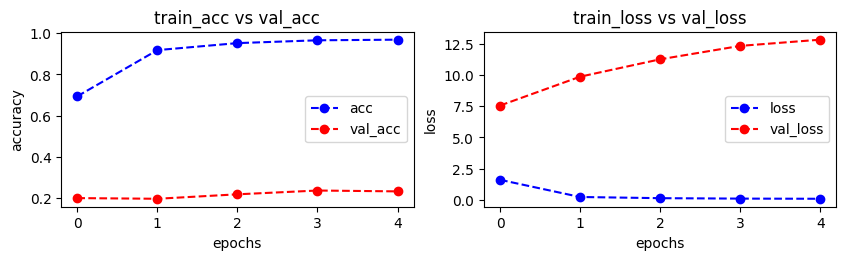

In [61]:
plot_accuracy_loss(history)

In [62]:
test_loss = model2.evaluate(test_features, test_labels)

85/85 [==============================] - 0s 5ms/step - loss: 3.1730 - accuracy: 0.8451


## Ensemble NN

In [53]:
np.random.seed(seed=1997)
# Number of estimators
n_estimators = 10
# Proporition of samples to use to train each training
max_samples = 0.8

max_samples *= n_train
max_samples = int(max_samples)

## Run before this

In [ ]:
models = list()
random = np.random.randint(50, 100, size = n_estimators)

for i in range(n_estimators):
    
    # Model
    model = tf.keras.Sequential([  tf.keras.applications.ResNet50(include_top=False, input_tensor=Input(shape= (224,224,3))),
                                   tf.keras.layers.Flatten(),
#                                  tf.keras.layers.Flatten(input_shape = (x, y, z)),
                                # One layer with random size
                                    tf.keras.layers.Dense(random[i], activation=tf.nn.relu),
                                    tf.keras.layers.Dense(6, activation=tf.nn.softmax)
                                ])
    
    model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics=['accuracy'])
    
    # Store model
    models.append(model)

In [54]:
# models = list()
# random = np.random.randint(50, 100, size = n_estimators)

# for i in range(n_estimators):
    
#     # Model
#     model = tf.keras.Sequential([ 
#                                  tf.keras.layers.Flatten(input_shape = (x, y, z)),
#                                 # One layer with random size
#                                     tf.keras.layers.Dense(random[i], activation=tf.nn.relu),
#                                     tf.keras.layers.Dense(6, activation=tf.nn.softmax)
#                                 ])
    
#     model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics=['accuracy'])
    
#     # Store model
#     models.append(model)

In [55]:
models

In [56]:
histories = []

for i in range(n_estimators):
    # Train each model on a bag of the training data
    train_idx = np.random.choice(len(train_features), size = max_samples)
    histories.append(models[i].fit(train_features[train_idx], train_labels[train_idx], batch_size=128, epochs=10, validation_split = 0.1))

Epoch 1/10
62/62 [==============================] - 2s 34ms/step - loss: 0.8681 - accuracy: 0.7655 - val_loss: 0.2060 - val_accuracy: 0.9404
Epoch 2/10
62/62 [==============================] - 2s 29ms/step - loss: 0.1220 - accuracy: 0.9735 - val_loss: 0.1201 - val_accuracy: 0.9725
Epoch 3/10
62/62 [==============================] - 2s 28ms/step - loss: 0.0610 - accuracy: 0.9911 - val_loss: 0.0896 - val_accuracy: 0.9748
Epoch 4/10
62/62 [==============================] - 2s 28ms/step - loss: 0.0372 - accuracy: 0.9963 - val_loss: 0.0592 - val_accuracy: 0.9862
Epoch 5/10
62/62 [==============================] - 2s 28ms/step - loss: 0.0245 - accuracy: 0.9986 - val_loss: 0.0434 - val_accuracy: 0.9897
Epoch 6/10
62/62 [==============================] - 2s 28ms/step - loss: 0.0149 - accuracy: 0.9997 - val_loss: 0.0365 - val_accuracy: 0.9885
Epoch 7/10
62/62 [==============================] - 2s 28ms/step - loss: 0.0109 - accuracy: 1.0000 - val_loss: 0.0420 - val_accuracy: 0.9851
Epoch 8/10
62

62/62 [==============================] - 1s 13ms/step - loss: 0.0056 - accuracy: 1.0000 - val_loss: 0.0188 - val_accuracy: 0.9966
Epoch 10/10
62/62 [==============================] - 1s 13ms/step - loss: 0.0047 - accuracy: 1.0000 - val_loss: 0.0226 - val_accuracy: 0.9943
Epoch 1/10
62/62 [==============================] - 1s 15ms/step - loss: 0.7564 - accuracy: 0.7806 - val_loss: 0.2001 - val_accuracy: 0.9438
Epoch 2/10
62/62 [==============================] - 1s 13ms/step - loss: 0.1318 - accuracy: 0.9679 - val_loss: 0.1160 - val_accuracy: 0.9771
Epoch 3/10
62/62 [==============================] - 1s 13ms/step - loss: 0.0709 - accuracy: 0.9894 - val_loss: 0.0883 - val_accuracy: 0.9805
Epoch 4/10
62/62 [==============================] - 1s 13ms/step - loss: 0.0460 - accuracy: 0.9945 - val_loss: 0.0657 - val_accuracy: 0.9874
Epoch 5/10
62/62 [==============================] - 1s 13ms/step - loss: 0.0311 - accuracy: 0.9972 - val_loss: 0.0537 - val_accuracy: 0.9897
Epoch 6/10
62/62 [=====

In [322]:
test_features.shape

(2698, 7, 7, 512)

In [62]:
histories

{'loss': [0.8680917620658875,
  0.12199709564447403,
  0.060956064611673355,
  0.03721332550048828,
  0.02446858398616314,
  0.014939443208277225,
  0.010941354557871819,
  0.008681045845150948,
  0.006466219667345285,
  0.005123045761138201],
 'accuracy': [0.7655453681945801,
  0.9734964370727539,
  0.9910805225372314,
  0.9963048100471497,
  0.9985983967781067,
  0.9997451305389404,
  1.0,
  1.0,
  1.0,
  1.0],
 'val_loss': [0.20599117875099182,
  0.1201053261756897,
  0.08960476517677307,
  0.05924564227461815,
  0.04344616457819939,
  0.03648435324430466,
  0.042009223252534866,
  0.027181284502148628,
  0.026195116341114044,
  0.02527334913611412],
 'val_accuracy': [0.9403669834136963,
  0.9724770784378052,
  0.9747706651687622,
  0.9862385392189026,
  0.9896789193153381,
  0.9885321259498596,
  0.9850917458534241,
  0.9931192398071289,
  0.9931192398071289,
  0.9908257126808167]}

In [75]:
def plot_accuracy_loss_ensemble(history):
    """
        Plot the accuracy and the loss during the training of the nn.
    """
    for i in range(10):
        fig = plt.figure(figsize=(10,5))

    # Plot accuracy
        plt.subplot(221)
        print(i,history)
        plt.plot(history[i].history['accuracy'],'bo--', label = "acc")
        plt.plot(history[i].history['val_accuracy'], 'ro--', label = "val_acc")
        plt.title("train_acc vs val_acc")
        plt.ylabel("accuracy")
        plt.xlabel("epochs")
        plt.legend()

    # Plot loss function
        plt.subplot(222)
        plt.plot(history[i].history['loss'],'bo--', label = "loss")
        plt.plot(history[i].history['val_loss'], 'ro--', label = "val_loss")
        plt.title("train_loss vs val_loss")
        plt.ylabel("loss")
        plt.xlabel("epochs")

        plt.legend()
        plt.show()

In [74]:
histories[0].history['accuracy']

[0.7655453681945801,
 0.9734964370727539,
 0.9910805225372314,
 0.9963048100471497,
 0.9985983967781067,
 0.9997451305389404,
 1.0,
 1.0,
 1.0,
 1.0]

0 [<keras.callbacks.History object at 0x000001E4806DD550>, <keras.callbacks.History object at 0x000001E3A44E6610>, <keras.callbacks.History object at 0x000001E3A32F7EB0>, <keras.callbacks.History object at 0x000001E481B65FA0>, <keras.callbacks.History object at 0x000001E4812E0A90>, <keras.callbacks.History object at 0x000001E4812726D0>, <keras.callbacks.History object at 0x000001E48157DC40>, <keras.callbacks.History object at 0x000001E48180D3D0>, <keras.callbacks.History object at 0x000001E481ADAEE0>, <keras.callbacks.History object at 0x000001E481CE8AF0>]


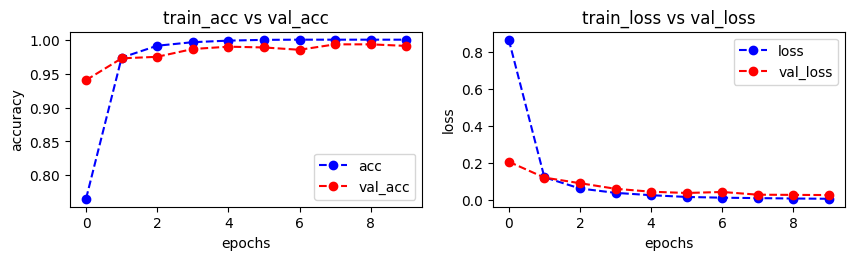

1 [<keras.callbacks.History object at 0x000001E4806DD550>, <keras.callbacks.History object at 0x000001E3A44E6610>, <keras.callbacks.History object at 0x000001E3A32F7EB0>, <keras.callbacks.History object at 0x000001E481B65FA0>, <keras.callbacks.History object at 0x000001E4812E0A90>, <keras.callbacks.History object at 0x000001E4812726D0>, <keras.callbacks.History object at 0x000001E48157DC40>, <keras.callbacks.History object at 0x000001E48180D3D0>, <keras.callbacks.History object at 0x000001E481ADAEE0>, <keras.callbacks.History object at 0x000001E481CE8AF0>]


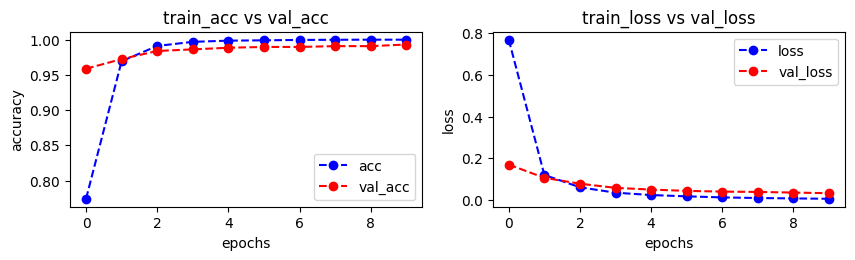

2 [<keras.callbacks.History object at 0x000001E4806DD550>, <keras.callbacks.History object at 0x000001E3A44E6610>, <keras.callbacks.History object at 0x000001E3A32F7EB0>, <keras.callbacks.History object at 0x000001E481B65FA0>, <keras.callbacks.History object at 0x000001E4812E0A90>, <keras.callbacks.History object at 0x000001E4812726D0>, <keras.callbacks.History object at 0x000001E48157DC40>, <keras.callbacks.History object at 0x000001E48180D3D0>, <keras.callbacks.History object at 0x000001E481ADAEE0>, <keras.callbacks.History object at 0x000001E481CE8AF0>]


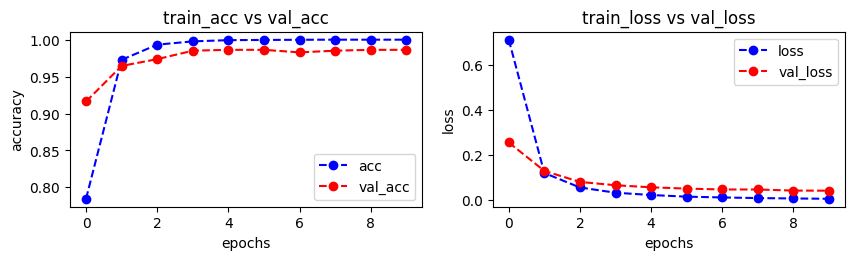

3 [<keras.callbacks.History object at 0x000001E4806DD550>, <keras.callbacks.History object at 0x000001E3A44E6610>, <keras.callbacks.History object at 0x000001E3A32F7EB0>, <keras.callbacks.History object at 0x000001E481B65FA0>, <keras.callbacks.History object at 0x000001E4812E0A90>, <keras.callbacks.History object at 0x000001E4812726D0>, <keras.callbacks.History object at 0x000001E48157DC40>, <keras.callbacks.History object at 0x000001E48180D3D0>, <keras.callbacks.History object at 0x000001E481ADAEE0>, <keras.callbacks.History object at 0x000001E481CE8AF0>]


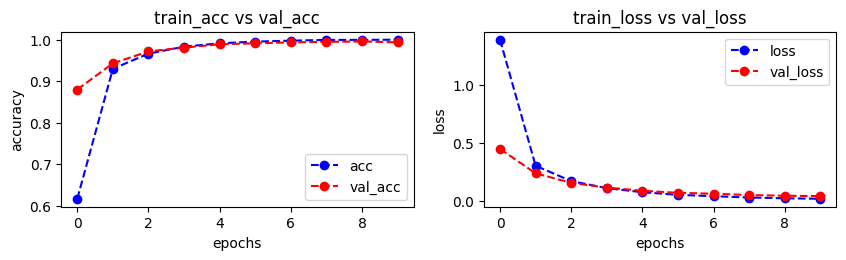

4 [<keras.callbacks.History object at 0x000001E4806DD550>, <keras.callbacks.History object at 0x000001E3A44E6610>, <keras.callbacks.History object at 0x000001E3A32F7EB0>, <keras.callbacks.History object at 0x000001E481B65FA0>, <keras.callbacks.History object at 0x000001E4812E0A90>, <keras.callbacks.History object at 0x000001E4812726D0>, <keras.callbacks.History object at 0x000001E48157DC40>, <keras.callbacks.History object at 0x000001E48180D3D0>, <keras.callbacks.History object at 0x000001E481ADAEE0>, <keras.callbacks.History object at 0x000001E481CE8AF0>]


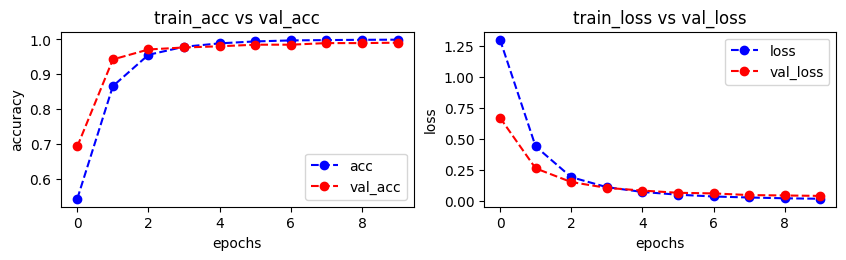

5 [<keras.callbacks.History object at 0x000001E4806DD550>, <keras.callbacks.History object at 0x000001E3A44E6610>, <keras.callbacks.History object at 0x000001E3A32F7EB0>, <keras.callbacks.History object at 0x000001E481B65FA0>, <keras.callbacks.History object at 0x000001E4812E0A90>, <keras.callbacks.History object at 0x000001E4812726D0>, <keras.callbacks.History object at 0x000001E48157DC40>, <keras.callbacks.History object at 0x000001E48180D3D0>, <keras.callbacks.History object at 0x000001E481ADAEE0>, <keras.callbacks.History object at 0x000001E481CE8AF0>]


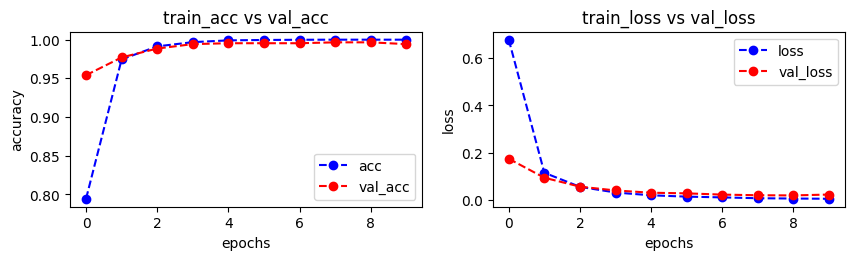

6 [<keras.callbacks.History object at 0x000001E4806DD550>, <keras.callbacks.History object at 0x000001E3A44E6610>, <keras.callbacks.History object at 0x000001E3A32F7EB0>, <keras.callbacks.History object at 0x000001E481B65FA0>, <keras.callbacks.History object at 0x000001E4812E0A90>, <keras.callbacks.History object at 0x000001E4812726D0>, <keras.callbacks.History object at 0x000001E48157DC40>, <keras.callbacks.History object at 0x000001E48180D3D0>, <keras.callbacks.History object at 0x000001E481ADAEE0>, <keras.callbacks.History object at 0x000001E481CE8AF0>]


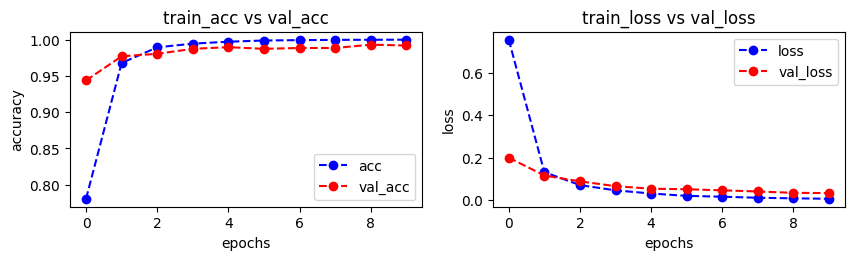

7 [<keras.callbacks.History object at 0x000001E4806DD550>, <keras.callbacks.History object at 0x000001E3A44E6610>, <keras.callbacks.History object at 0x000001E3A32F7EB0>, <keras.callbacks.History object at 0x000001E481B65FA0>, <keras.callbacks.History object at 0x000001E4812E0A90>, <keras.callbacks.History object at 0x000001E4812726D0>, <keras.callbacks.History object at 0x000001E48157DC40>, <keras.callbacks.History object at 0x000001E48180D3D0>, <keras.callbacks.History object at 0x000001E481ADAEE0>, <keras.callbacks.History object at 0x000001E481CE8AF0>]


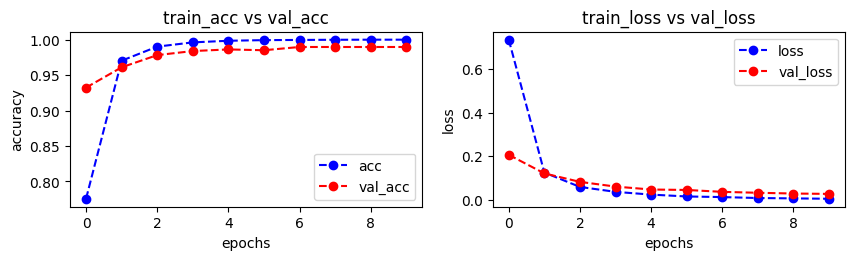

8 [<keras.callbacks.History object at 0x000001E4806DD550>, <keras.callbacks.History object at 0x000001E3A44E6610>, <keras.callbacks.History object at 0x000001E3A32F7EB0>, <keras.callbacks.History object at 0x000001E481B65FA0>, <keras.callbacks.History object at 0x000001E4812E0A90>, <keras.callbacks.History object at 0x000001E4812726D0>, <keras.callbacks.History object at 0x000001E48157DC40>, <keras.callbacks.History object at 0x000001E48180D3D0>, <keras.callbacks.History object at 0x000001E481ADAEE0>, <keras.callbacks.History object at 0x000001E481CE8AF0>]


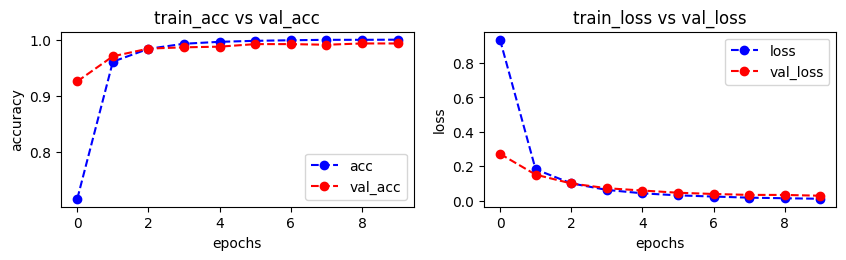

9 [<keras.callbacks.History object at 0x000001E4806DD550>, <keras.callbacks.History object at 0x000001E3A44E6610>, <keras.callbacks.History object at 0x000001E3A32F7EB0>, <keras.callbacks.History object at 0x000001E481B65FA0>, <keras.callbacks.History object at 0x000001E4812E0A90>, <keras.callbacks.History object at 0x000001E4812726D0>, <keras.callbacks.History object at 0x000001E48157DC40>, <keras.callbacks.History object at 0x000001E48180D3D0>, <keras.callbacks.History object at 0x000001E481ADAEE0>, <keras.callbacks.History object at 0x000001E481CE8AF0>]


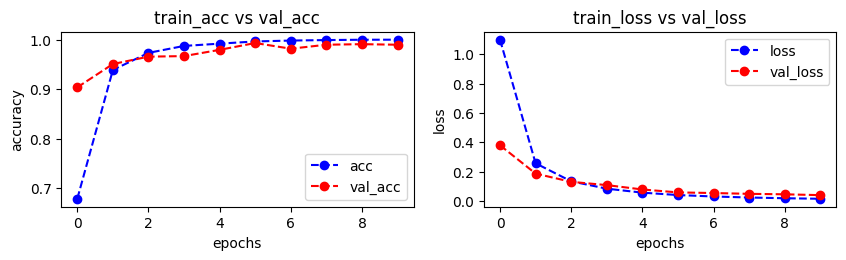

In [76]:
plot_accuracy_loss_ensemble(histories)


In [331]:
predictions = []
for i in range(n_estimators):
    predictions.append(models[i].predict(test_features))
    
predictions_array = np.array(predictions)
print('after array',len(predictions_array),'<-length',predictions_array.shape,'<-shape',predictions)
predictions_sum = predictions_array.sum(axis = 0)
print('after sum',len(predictions_sum),'<-length',predictions_sum.shape,'<-shape',predictions)
pred_labels = predictions_sum.argmax(axis=1)
print('final',len(pred_labels),'<-length',pred_labels.shape,'<-shape',pred_labels)

85/85 [==============================] - 1s 7ms/step
after array 10 <-length (10, 2698, 6) <-shape [array([[9.9047685e-01, 1.7574836e-06, 1.0881382e-03, 8.4317680e-03,
        1.0531651e-06, 3.3516613e-07],
       [9.9995744e-01, 4.7485560e-06, 6.0722678e-06, 3.0994990e-05,
        7.5393757e-07, 3.1811412e-10],
       [9.9295759e-01, 5.3538592e-04, 2.1957727e-05, 6.3891038e-03,
        9.5546900e-05, 3.9013551e-07],
       ...,
       [1.0937548e-06, 2.6690245e-06, 5.7314232e-04, 1.3177251e-05,
        1.5735664e-07, 9.9940979e-01],
       [1.3411466e-09, 6.0065204e-06, 2.8072704e-05, 1.5456015e-08,
        1.8051182e-07, 9.9996567e-01],
       [1.2987490e-06, 2.0538782e-06, 1.6980640e-06, 7.0538302e-03,
        1.4652517e-06, 9.9293971e-01]], dtype=float32), array([[9.9799514e-01, 1.7263871e-09, 6.5923945e-05, 1.9332189e-03,
        7.3857507e-09, 5.7320390e-06],
       [9.9999380e-01, 1.1350825e-10, 3.8850621e-06, 2.3073219e-06,
        3.0675415e-10, 5.1985886e-08],
       [9.96475

In [ ]:

print('final',len(pred_labels),'<-length',pred_labels.shape,'<-shape',pred_labels)

In [344]:
predictions_array[0][0][0]

0.99047685

In [346]:
predictions_array[9]


array([[9.9937207e-01, 9.0994583e-08, 1.2439948e-04, 5.0329301e-04,
        1.5858873e-09, 2.2255809e-07],
       [9.9999881e-01, 5.7909794e-10, 7.4443460e-07, 4.7786796e-07,
        2.8226801e-10, 3.7309797e-10],
       [9.9893051e-01, 5.6185308e-06, 1.8932042e-05, 1.0443034e-03,
        2.3891522e-07, 3.1153169e-07],
       ...,
       [9.1884103e-06, 3.1026357e-07, 3.6664566e-03, 3.9546969e-05,
        8.4015585e-07, 9.9628371e-01],
       [9.9426412e-10, 5.1727829e-07, 8.0965146e-05, 5.0465121e-07,
        1.0470876e-06, 9.9991691e-01],
       [6.6054326e-06, 1.4283928e-06, 2.0711379e-05, 8.1933457e-03,
        6.6218381e-06, 9.9177128e-01]], dtype=float32)

In [347]:
j = 0
for i in range(10):
    j = predictions_array[i][0][0] + j
j

9.964130520820618

In [351]:
predictions_sum.argmax(axis=1
                         )

array([0, 0, 0, ..., 5, 5, 5], dtype=int64)

In [303]:
pred_labels.shape

(2698,)

In [302]:
test_labels.shape

(2698,)

In [255]:
from sklearn.metrics import accuracy_score
print("Accuracy : {}".format(accuracy_score(test_labels, pred_labels)))

Accuracy : 0.9873980726464048


In [ ]:
from sklearn.metrics import classification_report

# label_names = ['label A', 'label B', 'label C', 'label D']

print(classification_report(test_labels, pred_labels,target_names=class_names))

In [ ]:
clf_report = classification_report(test_labels,
                                   pred_labels,
                                   target_names=class_names,
                                   output_dict=True)

In [ ]:
import seaborn as sns
sns.heatmap(pd.DataFrame(clf_report).iloc[:-1, :].T, annot=True)

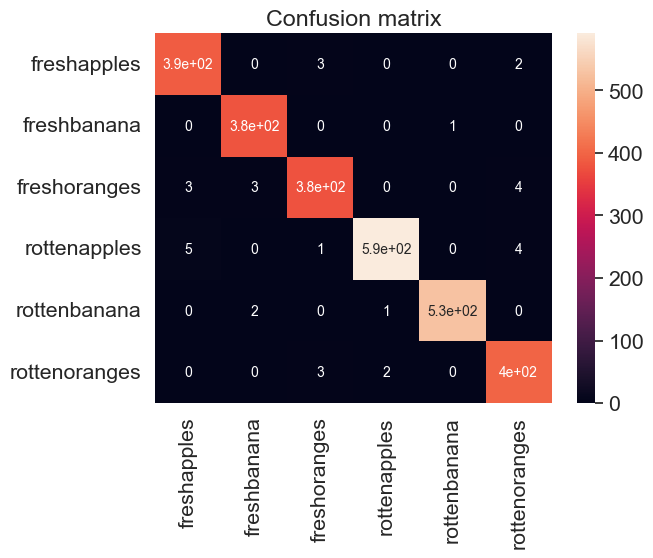

In [256]:
CM = confusion_matrix(test_labels, pred_labels)
ax = plt.axes()
sn.heatmap(CM, annot=True, 
           annot_kws={"size": 10}, 
           xticklabels=class_names, 
           yticklabels=class_names, ax = ax)
ax.set_title('Confusion matrix')
plt.show()

In [ ]:
predictions = model.predict(test_images)     # Vector of probabilities
pred_labels = np.argmax(predictions, axis = 1) # We take the highest probability

display_random_image(class_names, test_images, pred_labels,0)

## Validate with some custom samples

In [404]:
def predict_image(image_path):
    fig = plt.figure(figsize=(5,5))
    fig.suptitle("Sample Prediction from the dataset", fontsize=16)
#     plt.subplot(5,5,i+1)
    
     # Open and resize the img
    val_image = cv2.imread(image_path)
    val_image = cv2.cvtColor(val_image, cv2.COLOR_BGR2RGB)
    val_image = cv2.resize(val_image, IMAGE_SIZE) 
    val_image = np.expand_dims(val_image,axis=0)
    validate_features = model.predict(val_image)
    predictions = []
    for i in range(n_estimators):
            predictions.append(models[i].predict(validate_features))
    
    predictions_array = np.array(predictions)
    predictions_sum = predictions_array.sum(axis = 0)
    pred_labels = predictions_sum.argmax(axis=1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    image = mpimg.imread(image_path)
    plt.imshow(image)
    plt.xlabel(class_names[pred_labels[0]])
    plt.show()


1/1 [==============================] - 0s 16ms/step


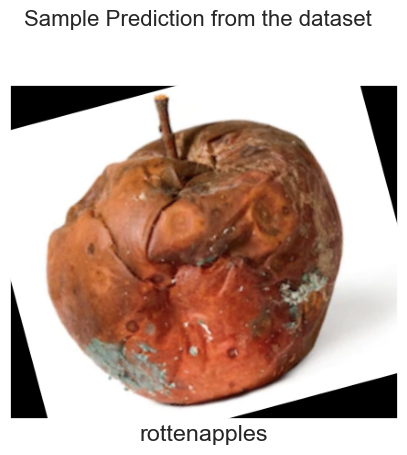

In [415]:
img_path = './data/rotap1.png'
predict_image(img_path)

1/1 [==============================] - 0s 16ms/step


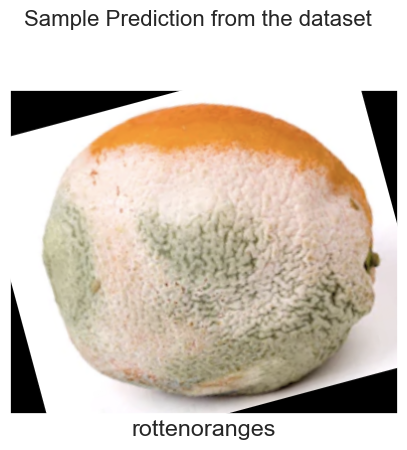

In [425]:
img_path = './data/rotor2.png'
predict_image(img_path)

1/1 [==============================] - 0s 15ms/step


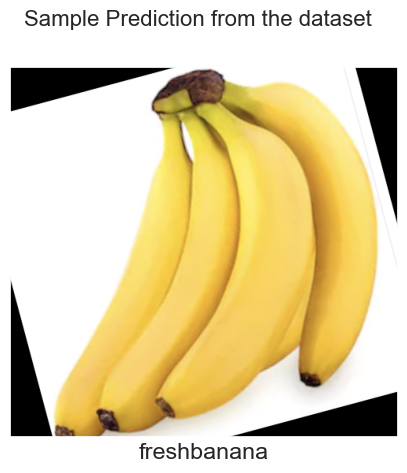

In [418]:
img_path = './data/freban1.png'
predict_image(img_path)

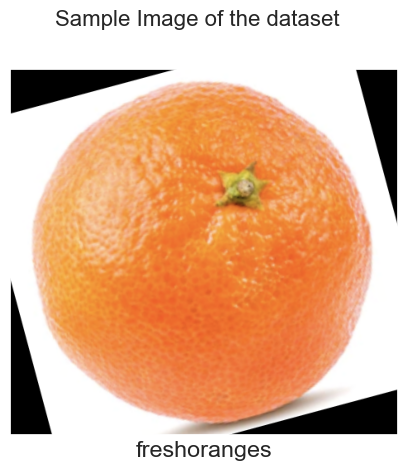

In [439]:
img_path = './data/freor1.png'
predict_image(img_path)

1/1 [==============================] - 0s 16ms/step


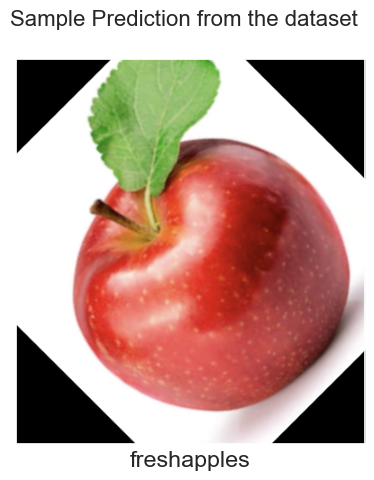

In [428]:
img_path = './data/freapp2.png'
predict_image(img_path)

1/1 [==============================] - 0s 16ms/step


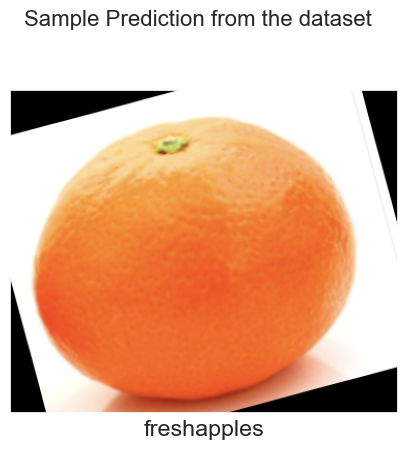

In [438]:
img_path = './data/freor1.png'
predict_image(img_path)

1/1 [==============================] - 0s 16ms/step


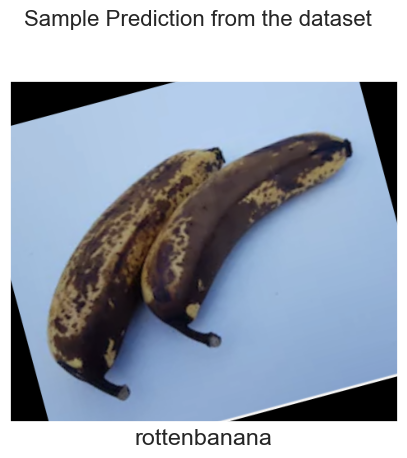

In [421]:
img_path = './data/rotba1.png'
predict_image(img_path)

1/1 [==============================] - 0s 15ms/step


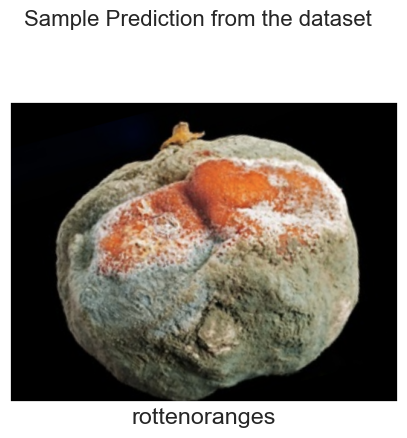

In [409]:
img_path = './data/rotor1.png'
predict_image(img_path)

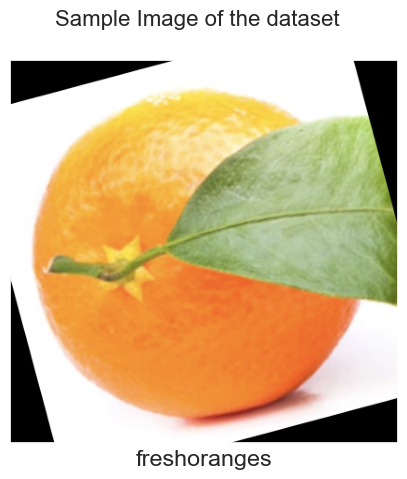

In [441]:
img_path = './data/freor2.png'
predict_image(img_path)

1/1 [==============================] - 0s 15ms/step


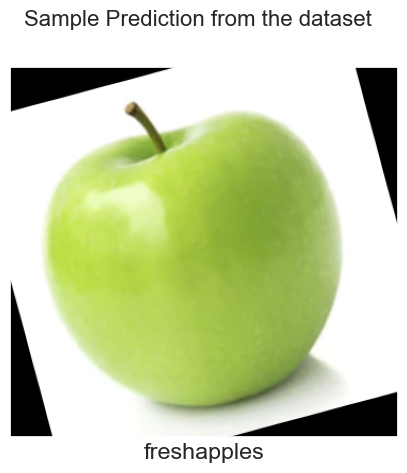

In [427]:
img_path = './data/freapp1.png'
predict_image(img_path)

In [260]:
from sklearn.metrics import classification_report



print(classification_report(test_labels, pred_labels,target_names=class_names))

               precision    recall  f1-score   support

  freshapples       0.98      0.99      0.98       395
  freshbanana       0.99      1.00      0.99       381
 freshoranges       0.98      0.97      0.98       388
 rottenapples       0.99      0.98      0.99       601
 rottenbanana       1.00      0.99      1.00       530
rottenoranges       0.98      0.99      0.98       403

     accuracy                           0.99      2698
    macro avg       0.99      0.99      0.99      2698
 weighted avg       0.99      0.99      0.99      2698



In [271]:
clf_report = classification_report(test_labels,
                                   pred_labels,
                                   target_names=class_names,
                                   output_dict=True)

<AxesSubplot:>

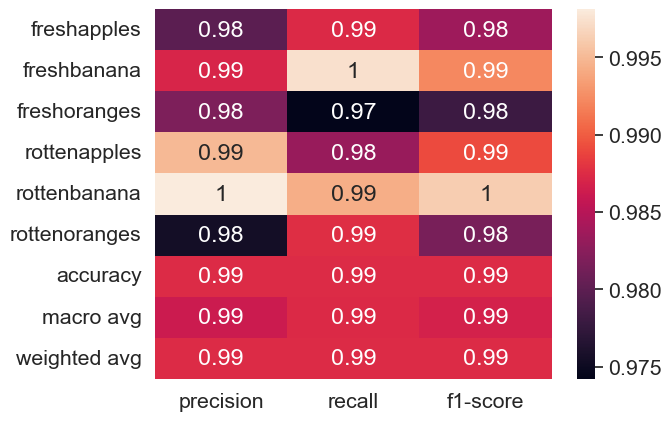

In [273]:
import seaborn as sns
sns.heatmap(pd.DataFrame(clf_report).iloc[:-1, :].T, annot=True)

In [257]:
class_names

['freshapples',
 'freshbanana',
 'freshoranges',
 'rottenapples',
 'rottenbanana',
 'rottenoranges']

In [91]:
model = Sequential()

In [93]:
# history = model.fit(train_batches, epochs=17,validation_data=test_batches)

In [94]:

def plotresults():
    %matplotlib inline
    import matplotlib.image as mpimg
    import matplotlib.pyplot as plt
    plt.style.use('default')
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy'] 
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(len(acc))

    plt.plot(epochs, acc, 'r')
    plt.plot(epochs, val_acc, 'b')
    plt.title('Training and Validation Accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.figure()

    plt.plot(epochs, loss, 'r')
    plt.plot(epochs, val_loss, 'b')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.title('Training and Validaion Loss')

    plt.figure()

In [95]:
# import matplotlib.pyplot as plt
# import matplotlib.image as mpimg
# from tensorflow.keras.preprocessing import image as image_utils
# from tensorflow.keras.applications.imagenet_utils import preprocess_input
# import numpy as np

# classes=['freshapples', 'freshbanana', 'freshoranges', 'rottenapples', 'rottenbanana','rottenoranges']


# def show_image(image_path):
#     image = mpimg.imread(image_path)
#     plt.imshow(image)

# def make_predictions(image_path):
#     show_image(image_path)
#     image = image_utils.load_img(image_path, target_size=(20, 20))
#     image = image_utils.img_to_array(image)
#     image = image.reshape(1,20,20,3)
#     image = preprocess_input(image)
#     preds = model.predict(image)
#     return preds

In [96]:
# prediction= make_predictions('./data/pic2.png')
# MaxPosition=np.argmax(prediction)  
# prediction_label=classes[MaxPosition]
# print(prediction_label) 

In [97]:
# prediction= make_predictions('./data/pic.png')
# MaxPosition=np.argmax(prediction)  
# prediction_label=classes[MaxPosition]
# print(prediction_label) 

In [98]:
# prediction= make_predictions('./data/pic3rotor.png')
# MaxPosition=np.argmax(prediction)  
# prediction_label=classes[MaxPosition]
# print(prediction_label) 

# Prepare data for Training

In [99]:
train_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input,
    rescale=1./255,
    width_shift_range=0.2, #0.2, 0.5
    height_shift_range=0.2, #0.2, 0.5
    shear_range=0.2,
    zoom_range=[0.5, 1.0], # 0.2, 0.5, [0.5,1.0]
    rotation_range=90, #20, 40, 60, 90
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='reflect' #nearest, reflect, wrap
)

validation_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input,
    rescale=1./255
    
)

In [100]:
train_generator = train_datagen.flow_from_directory(train_path,
                                                    batch_size=32,
                                                    color_mode="rgb",
                                                    # shuffle = False,
                                                    target_size=(224,224),
                                                    class_mode='categorical')

validation_generator = train_datagen.flow_from_directory(test_path,
                                                         batch_size=32,
                                                         color_mode="rgb",
                                                         # shuffle = False,
                                                         target_size=(224,224),
                                                         class_mode='categorical')

Found 10901 images belonging to 6 classes.
Found 2698 images belonging to 6 classes.


# Models

In [54]:
from tensorflow.keras.applications import Xception, VGG16, InceptionV3
from tensorflow.keras import layers
from tensorflow.keras import Model
import pandas as pd

####################### init pre_trained_model #################################

pre_trained_model = InceptionV3(input_shape=(150,150,3),
                                include_top=False)

# pre_trained_model = VGG16(input_shape=(150,150,3),
#                           include_top=False)

# pre_trained_model = Xception(input_shape=(150,150,3),
#                              include_top=False)

# pre_trained_model.layers.pop()

####################### init pre_trained_model #################################

############################## freeze layer ####################################

for layer in pre_trained_model.layers:
    layer.trainable = False

# for layer in pre_trained_model.layers[:-4]:
#     layer.trainable = False

############################## freeze layer ####################################

############################## Flatten Layer ###################################

# last_output = pre_trained_model.layers[-1].output
# x = layers.Flatten()(last_output)

x = layers.Flatten()(pre_trained_model.output)

############################## Flatten Layer ###################################

######################### Fully Connected Layer ################################

x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.2)(x)
x = layers.Dense(6, activation='softmax')(x)

######################### Fully Connected Layer ################################

model = Model(pre_trained_model.input, x) 
model.compile(optimizer='adam', #RMSprop(lr=0.0001), adam
              loss='categorical_crossentropy',
              metrics=['accuracy'])

pd.set_option('max_colwidth', None)
layers = [(layer, layer.name, layer.trainable) for layer in pre_trained_model.layers]
pd.DataFrame(layers, columns=['Layer Type', 'Layer Name', 'Layer Trainable'])

,Layer Type,Layer Name,Layer Trainable
0,<keras.engine.input_layer.InputLayer object at 0x000002633AC997F0>,input_6,False
1,<keras.layers.convolutional.conv2d.Conv2D object at 0x000002633450ED60>,conv2d_94,False
2,<keras.layers.normalization.batch_normalization.BatchNormalization object at 0x000002633450E0A0>,batch_normalization_96,False
3,<keras.layers.core.activation.Activation object at 0x000002633AC1CDF0>,activation_94,False
4,<keras.layers.convolutional.conv2d.Conv2D object at 0x000002633AC17820>,conv2d_95,False
...,...,...,...
306,<keras.layers.core.activation.Activation object at 0x00000263489DD2E0>,activation_179,False
307,<keras.layers.merging.concatenate.Concatenate object at 0x00000263489FBE20>,mixed9_1,False
308,<keras.layers.merging.concatenate.Concatenate object at 0x00000263489EC400>,concatenate_3,False
309,<keras.layers.core.activation.Activation object at 0x0000026348932D60>,activation_187,False


In [55]:
history = model.fit(
    train_generator,
#     steps_per_epoch=(train_len/32),
    epochs=10,
    verbose=1,
#     callbacks=[callbacks],
    validation_data=validation_generator,
#     validation_steps=(val_len/32)
)

Epoch 1/10
341/341 [==============================] - 184s 530ms/step - loss: 2.4933 - accuracy: 0.8527 - val_loss: 0.2453 - val_accuracy: 0.9092
Epoch 2/10
341/341 [==============================] - 273s 800ms/step - loss: 0.2768 - accuracy: 0.9062 - val_loss: 0.2201 - val_accuracy: 0.9222
Epoch 3/10
341/341 [==============================] - 844s 2s/step - loss: 0.2443 - accuracy: 0.9158 - val_loss: 0.1916 - val_accuracy: 0.9348
Epoch 4/10
341/341 [==============================] - 144s 421ms/step - loss: 0.2244 - accuracy: 0.9244 - val_loss: 0.1612 - val_accuracy: 0.9433
Epoch 5/10
341/341 [==============================] - 144s 423ms/step - loss: 0.1982 - accuracy: 0.9352 - val_loss: 0.2199 - val_accuracy: 0.9244
Epoch 6/10
341/341 [==============================] - 145s 424ms/step - loss: 0.1905 - accuracy: 0.9351 - val_loss: 0.1703 - val_accuracy: 0.9437
Epoch 7/10
341/341 [==============================] - 144s 423ms/step - loss: 0.1956 - accuracy: 0.9335 - val_loss: 0.1398 - va

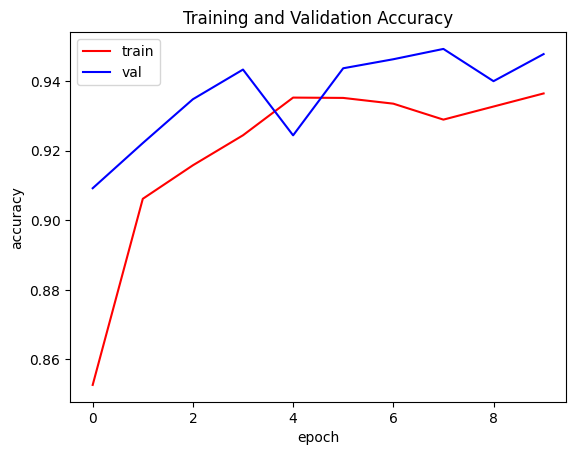

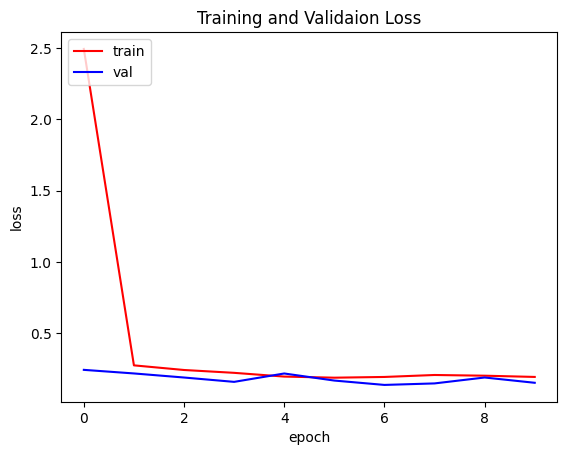

<Figure size 640x480 with 0 Axes>

In [56]:
plotresults()

# Transfer Learning VGG16

In [57]:
from tensorflow.keras.applications import Xception, VGG16, InceptionV3
from tensorflow.keras import layers
from tensorflow.keras import Model
import pandas as pd


####################### init pre_trained_model #################################

# pre_trained_model = InceptionV3(input_shape=(150,150,3),
#                                 include_top=False)

pre_trained_model = VGG16(input_shape=(150,150,3),
                          include_top=False)

# pre_trained_model = Xception(input_shape=(150,150,3),
#                              include_top=False)

# pre_trained_model.layers.pop()

####################### init pre_trained_model #################################

############################## freeze layer ####################################

for layer in pre_trained_model.layers:
    layer.trainable = False

# for layer in pre_trained_model.layers[:-4]:
#     layer.trainable = False

############################## freeze layer ####################################

############################## Flatten Layer ###################################

# last_output = pre_trained_model.layers[-1].output
# x = layers.Flatten()(last_output)

x = layers.Flatten()(pre_trained_model.output)

############################## Flatten Layer ###################################

######################### Fully Connected Layer ################################

x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.2)(x)
x = layers.Dense(6, activation='softmax')(x)

######################### Fully Connected Layer ################################

model = Model(pre_trained_model.input, x) 
model.compile(optimizer= 'adam', #RMSprop(lr=0.0001), adam 
              loss='categorical_crossentropy',
              metrics=['accuracy'])

pd.set_option('max_colwidth', None)
layers = [(layer, layer.name, layer.trainable) for layer in pre_trained_model.layers]
pd.DataFrame(layers, columns=['Layer Type', 'Layer Name', 'Layer Trainable'])

,Layer Type,Layer Name,Layer Trainable
0,<keras.engine.input_layer.InputLayer object at 0x0000026349E835E0>,input_7,False
1,<keras.layers.convolutional.conv2d.Conv2D object at 0x0000026349E83880>,block1_conv1,False
2,<keras.layers.convolutional.conv2d.Conv2D object at 0x0000026349E839D0>,block1_conv2,False
3,<keras.layers.pooling.max_pooling2d.MaxPooling2D object at 0x0000026349E83790>,block1_pool,False
4,<keras.layers.convolutional.conv2d.Conv2D object at 0x000002630867E220>,block2_conv1,False
5,<keras.layers.convolutional.conv2d.Conv2D object at 0x00000263340C0A00>,block2_conv2,False
6,<keras.layers.pooling.max_pooling2d.MaxPooling2D object at 0x0000026349E83A00>,block2_pool,False
7,<keras.layers.convolutional.conv2d.Conv2D object at 0x00000263345C02E0>,block3_conv1,False
8,<keras.layers.convolutional.conv2d.Conv2D object at 0x00000263345C0160>,block3_conv2,False
9,<keras.layers.convolutional.conv2d.Conv2D object at 0x00000263345DA220>,block3_conv3,False


In [59]:
history = model.fit(
    train_generator,
#     steps_per_epoch=(train_len/32),
    epochs=10,
    verbose=1,
#     callbacks=[callbacks],
    validation_data=validation_generator,
#     validation_steps=(val_len/32)
)

Epoch 1/10
341/341 [==============================] - 404s 1s/step - loss: 0.6332 - accuracy: 0.7599 - val_loss: 0.4266 - val_accuracy: 0.8506
Epoch 2/10
341/341 [==============================] - 406s 1s/step - loss: 0.4256 - accuracy: 0.8407 - val_loss: 0.3229 - val_accuracy: 0.8851
Epoch 3/10
341/341 [==============================] - 407s 1s/step - loss: 0.3890 - accuracy: 0.8566 - val_loss: 0.2927 - val_accuracy: 0.8951
Epoch 4/10
341/341 [==============================] - 406s 1s/step - loss: 0.3523 - accuracy: 0.8690 - val_loss: 0.3394 - val_accuracy: 0.8714
Epoch 5/10
341/341 [==============================] - 405s 1s/step - loss: 0.3227 - accuracy: 0.8816 - val_loss: 0.3420 - val_accuracy: 0.8769
Epoch 6/10
341/341 [==============================] - 405s 1s/step - loss: 0.3229 - accuracy: 0.8813 - val_loss: 0.2501 - val_accuracy: 0.9129
Epoch 7/10
341/341 [==============================] - 407s 1s/step - loss: 0.3058 - accuracy: 0.8837 - val_loss: 0.2744 - val_accuracy: 0.8988

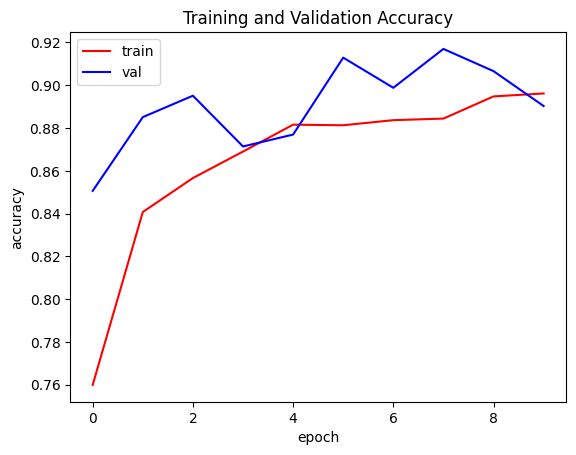

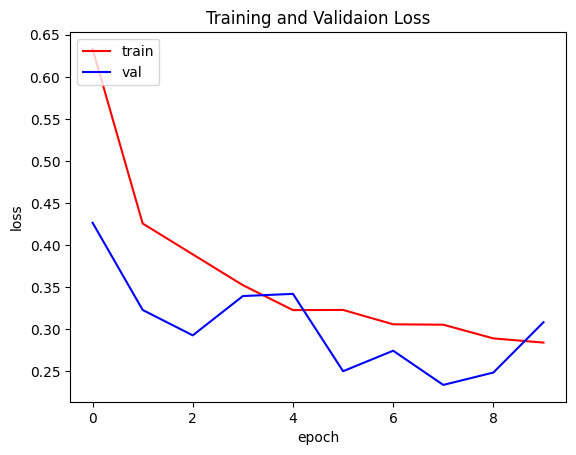

<Figure size 640x480 with 0 Axes>

In [60]:
plotresults()

# Resnet 50

In [105]:
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras import layers
from tensorflow.keras import Model
import pandas as pd
from tensorflow.keras.layers import Input
from tensorflow.keras import optimizers
# import BatchNormalization
from tensorflow.keras.layers import BatchNormalization

pre_trained_model = ResNet50(include_top=False, input_tensor=Input(shape= (224,224,3)))

for layer in pre_trained_model.layers:
    layer.trainable = False

# for layer in pre_trained_model.layers[:-4]:
#     layer.trainable = False

############################## freeze layer ####################################

############################## Flatten Layer ###################################

# last_output = pre_trained_model.layers[-1].output
# x = layers.Flatten()(last_output)

x = layers.Flatten()(pre_trained_model.output)

############################## Flatten Layer ###################################

######################### Fully Connected Layer ################################

x = layers.Dense(4096, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
# x = layers.Dense(512, activation='relu')(x)
x = BatchNormalization()(x)
# x = layers.Dropout(0.2)(x)


x = layers.Dense(6, activation='softmax')(x)

######################### Fully Connected Layer ################################

model = Model(pre_trained_model.input, x) 
model.compile( optimizer = 'adam', 
#     optimizer = optimizers.RMSprop(learning_rate=0.001), #RMSprop(lr=0.0001), adam
              loss='categorical_crossentropy',
              metrics=['accuracy'])

pd.set_option('max_colwidth', None)
layers = [(layer, layer.name, layer.trainable) for layer in pre_trained_model.layers]
pd.DataFrame(layers, columns=['Layer Type', 'Layer Name', 'Layer Trainable'])

,Layer Type,Layer Name,Layer Trainable
0,<keras.engine.input_layer.InputLayer object at 0x000002634A83E700>,input_9,False
1,<keras.layers.reshaping.zero_padding2d.ZeroPadding2D object at 0x000002634A83EDC0>,conv1_pad,False
2,<keras.layers.convolutional.conv2d.Conv2D object at 0x000002634A85E880>,conv1_conv,False
3,<keras.layers.normalization.batch_normalization.BatchNormalization object at 0x000002634A8A8280>,conv1_bn,False
4,<keras.layers.core.activation.Activation object at 0x000002634A84A520>,conv1_relu,False
...,...,...,...
170,<keras.layers.core.activation.Activation object at 0x0000026335847AF0>,conv5_block3_2_relu,False
171,<keras.layers.convolutional.conv2d.Conv2D object at 0x0000026335847D90>,conv5_block3_3_conv,False
172,<keras.layers.normalization.batch_normalization.BatchNormalization object at 0x0000026335847760>,conv5_block3_3_bn,False
173,<keras.layers.merging.add.Add object at 0x0000026335847AC0>,conv5_block3_add,False


In [107]:
model.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_9[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 56, 56, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 56, 56, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 28, 28, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 28, 28, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 14, 14, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 14, 14, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 14, 14, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 7, 7, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 7, 7, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 7, 7, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 7, 7, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

In [108]:
history = model.fit(
    train_generator,
#     steps_per_epoch=(train_len/32),
    epochs=5,
    verbose=1,
#     callbacks=[callbacks],
    validation_data=validation_generator,
#     validation_steps=(val_len/32)
)

Epoch 1/5
341/341 [==============================] - 807s 2s/step - loss: 1.5176 - accuracy: 0.4116 - val_loss: 20.3718 - val_accuracy: 0.1964
Epoch 2/5
341/341 [==============================] - 783s 2s/step - loss: 1.3148 - accuracy: 0.5058 - val_loss: 6.1822 - val_accuracy: 0.1742
Epoch 3/5
341/341 [==============================] - 785s 2s/step - loss: 1.2272 - accuracy: 0.5430 - val_loss: 2.9971 - val_accuracy: 0.2135
Epoch 4/5
183/341 [===============>..............] - ETA: 5:21 - loss: 1.1845 - accuracy: 0.5675

KeyboardInterrupt: 

In [ ]:
plotresults()